In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
# pip install missingno
import missingno
import warnings
warnings.filterwarnings("ignore")
import datetime
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder



: 

In [ ]:
# 시각화에 사용할 팔레트
plt.style.available

sns.color_palette("pastel")
sns.set(palette='pastel')

### 기본전처리

In [ ]:
heat = pd.read_csv("train_heat.csv", index_col=0)

# 컬럼명에서 train_heat. 제거
heat.columns = heat.columns.str.replace("train_heat.", "", regex=False)
heat.head(2)

# 날짜 데이터를 데이트타임으로 변경
heat['tm'] = pd.to_datetime(heat['tm'].astype(str), format="%Y%m%d%H")

# 263069개의 결측치 -> na로 대체
heat = heat.replace(-99, np.nan)

# 풍향 -9.9 값을 NaN으로 변경
heat['wd'] = heat['wd'].replace(-9.9, np.nan)

#타겟칼럼이 null이면 삭제
heat = heat.dropna(subset=['heat_demand'])

In [ ]:
heat

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,heat_demand
1,2021-01-01 01:00:00,A,-10.1,78.3,0.5,0.0,0.0,68.2,NaN,-8.2,281.0
2,2021-01-01 02:00:00,A,-10.2,71.9,0.6,0.0,0.0,69.9,NaN,-8.6,262.0
3,2021-01-01 03:00:00,A,-10.0,360.0,0.0,0.0,0.0,69.2,NaN,-8.8,266.0
4,2021-01-01 04:00:00,A,-9.3,155.9,0.5,0.0,0.0,65.0,NaN,-8.9,285.0
5,2021-01-01 05:00:00,A,-9.0,74.3,1.9,0.0,0.0,63.5,NaN,-9.2,283.0
...,...,...,...,...,...,...,...,...,...,...,...
499297,2023-12-31 19:00:00,S,3.2,233.5,0.4,2.5,0.0,91.5,NaN,2.8,34.0
499298,2023-12-31 20:00:00,S,2.9,227.4,0.1,2.5,0.0,92.1,NaN,2.7,35.0
499299,2023-12-31 21:00:00,S,2.1,360.0,0.0,2.5,0.0,93.3,NaN,1.4,35.0
499300,2023-12-31 22:00:00,S,2.2,30.0,1.4,2.5,0.0,95.5,NaN,1.3,40.0


In [ ]:
#시간 관련 변수 생성
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

heat['year'] = heat['tm'].dt.year  # 연도
heat['quarter'] = heat['tm'].dt.quarter  # 분기별
heat['month'] = heat['tm'].dt.month  # 월
heat['day'] = heat['tm'].dt.day  # 일
heat['hour'] = heat['tm'].dt.hour
heat['day_of_week'] = heat['tm'].dt.dayofweek  # 요일
heat['season'] = heat['month'].apply(get_season)  # 계절
heat['is_weekend'] = heat['day_of_week'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')  # 주말 여부
heat['weekofyear'] = heat['tm'].dt.isocalendar().week  # 주차

# 3시간 단위 시간대 컬럼 생성 (0~23시 → 0~7로 구간화)
heat['hour_group'] = (heat['tm'].dt.hour // 3).astype(int)
hour_labels = ['0-3', '3-6', '6-9', '9-12', '12-15', '15-18', '18-21', '21-24']


In [18]:
# 1) 전체 24시간 최저기온 (한파 판단용)
daily_min_temp = cluster_3.groupby('date')['ta'].min().reset_index(name='min_temp')

# 2) 밤 시간(18~23, 0~6시) 필터링
cluster_3['is_night'] = cluster_3['hour'].apply(lambda x: 1 if (x >= 18 or x <= 6) else 0)

# 밤 시간 데이터만 추출
night_df = cluster_3[cluster_3['is_night'] == 1]

# 밤 시간대 최저기온 (열대야 판단용)
night_min_temp = night_df.groupby('date')['ta'].min().reset_index(name='night_min_temp')

# 3) 두 데이터 합치기
result = pd.merge(daily_min_temp, night_min_temp, on='date', how='left')

# 4) 한파, 열대야 변수 생성
result['cold_wave'] = result['min_temp'].apply(lambda x: 1 if x <= -12 else 0)
result['tropical_night'] = result['night_min_temp'].apply(lambda x: 1 if x >= 25 else 0)

print(result)


            date  min_temp  night_min_temp  cold_wave  tropical_night
0     2021-01-01     -12.9           -12.9          1               0
1     2021-01-02      -9.1            -7.6          0               0
2     2021-01-03      -9.3            -9.0          0               0
3     2021-01-04     -10.1           -10.1          0               0
4     2021-01-05      -8.5            -8.5          0               0
...          ...       ...             ...        ...             ...
1090  2023-12-27      -3.7            -3.5          0               0
1091  2023-12-28      -2.6            -2.6          0               0
1092  2023-12-29      -4.4            -3.9          0               0
1093  2023-12-30      -3.2            -3.2          0               0
1094  2023-12-31       1.2             1.2          0               0

[1095 rows x 5 columns]


In [ ]:
# 공통 규칙 정의 #si변수 전처리

# A,B,C,F
common_night_rules_1 = [
    ((1, 1), (2, 6), 19, 7),
    ((2, 6), (3, 4), 20, 7),
    ((3, 4), (4, 7), 20, 6),
    ((4, 7), (4, 13), 21, 6),
    ((4, 13), (8, 28), 21, 5),
    ((8, 28), (9, 3), 21, 6),
    ((9, 3), (10, 12), 20, 6),
    ((10, 12), (11, 3), 19, 6),
    ((11, 3), (12, 31), 19, 7)
]

# D,E,G,H,I,J,K,S
common_night_rules_2 = [
    ((1, 1), (2, 5), 19, 7),
    ((2, 5), (3, 4), 20, 7),
    ((3, 4), (4, 7), 20, 6),
    ((4, 7), (4, 14), 21, 6),
    ((4, 14), (8, 28), 21, 5),
    ((8, 28), (9, 3), 21, 6),
    ((9, 3), (10, 13), 20, 6),
    ((10, 13), (11, 4), 19, 6),
    ((11, 4), (12, 31), 19, 7)
]

# L,M,N
common_night_rules_3 = [
    ((1, 1), (2, 10), 19, 7),
    ((2, 10), (2, 25), 20, 7),
    ((2, 25), (4, 9), 20, 6),
    ((4, 9), (4, 19), 20, 5),
    ((4, 19), (8, 26), 21, 5),
    ((8, 26), (9, 4), 20, 5),
    ((9, 4), (10, 7), 20, 6),
    ((10, 7), (11, 13), 19, 6),
    ((11, 13), (12, 31), 19, 7)
]

# O
common_night_rules_4 = [
    ((1, 1), (2, 6), 19, 7),
    ((2, 6), (3, 2), 20, 7),
    ((3, 2), (4, 11), 20, 6),
    ((4, 11), (4, 13), 21, 6),
    ((4, 13), (8,30), 21, 5),
    ((8, 30), (9, 1), 21, 6),
    ((9, 1), (10, 11), 20, 6),
    ((10, 11), (11, 7), 19, 6),
    ((11, 7), (12, 31), 19, 7)
]

# P
common_night_rules_5 = [
    ((1, 1), (2, 6), 19, 7),
    ((2, 6), (3, 3), 20, 7),
    ((3, 3), (4, 10), 20, 6),
    ((4, 10), (4, 13), 21, 6),
    ((4, 13), (8,30), 21, 5),
    ((8, 30), (9, 2), 21, 6),
    ((9, 2), (10, 12), 20, 6),
    ((10, 12), (11, 6), 19, 6),
    ((11, 6), (12, 31), 19, 7)
]

# Q
common_night_rules_6 = [
    ((1, 1), (2, 5), 19, 7),
    ((2, 5), (3, 5), 20, 7),
    ((3, 5), (4, 7), 20, 6),
    ((4, 7), (4, 14), 21, 6),
    ((4, 14), (8, 28), 21, 5),
    ((8, 28), (9, 3), 21, 6),
    ((9, 3), (10, 13), 20, 6),
    ((10, 13), (11, 2), 19, 6),
    ((11, 2), (12, 31), 19, 7)
]

# R
common_night_rules_7 = [
    ((1, 1), (2, 1), 19, 7),
    ((2, 1), (3, 2), 20, 7),
    ((3, 2), (4, 9), 20, 6),
    ((4, 9), (4, 15), 21, 6),
    ((4, 15), (8, 26), 21, 5),
    ((8, 26), (9, 2), 21, 6),
    ((9, 2), (10, 14), 20, 6),
    ((10, 14), (11, 8), 19, 6),
    ((11, 8), (12, 31), 19, 7)
]


# 브랜치별 야간 시간 규칙 딕셔너리
branch_night_rules = {
    'A': common_night_rules_1,
    'B': common_night_rules_1,
    'C': common_night_rules_1,
    'D': common_night_rules_2,
    'E': common_night_rules_2,
    'F': common_night_rules_1,
    'G': common_night_rules_2,
    'H': common_night_rules_2,
    'I': common_night_rules_2,
    'J': common_night_rules_2,
    'K': common_night_rules_2,
    'L': common_night_rules_3,
    'M': common_night_rules_3,
    'N': common_night_rules_3,
    'O': common_night_rules_4,
    'P': common_night_rules_5,
    'Q': common_night_rules_6,
    'R': common_night_rules_7,
    'S': common_night_rules_2
}

In [ ]:
# 모든 브랜치에 대해 야간 시간 적용
for branch, rules in branch_night_rules.items():
    is_branch = heat['branch_id'] == branch

    for (start_m, start_d), (end_m, end_d), night_start, night_end in rules:
        in_period = (
            ((heat['month'] > start_m) | ((heat['month'] == start_m) & (heat['day'] >= start_d))) &
            ((heat['month'] < end_m) | ((heat['month'] == end_m) & (heat['day'] <= end_d)))
        )

        if night_start > night_end:  # 자정을 넘기는 경우
            in_night = (heat['hour'] >= night_start) | (heat['hour'] <= night_end)
        else:
            in_night = (heat['hour'] >= night_start) & (heat['hour'] < night_end)

        # 조건에 맞는 행에 대해 si 값 0으로 설정
        mask = is_branch & in_period & in_night
        heat.loc[mask, 'si'] = 0


In [ ]:
# 풍향 sin, cos 변환
heat['wd_rad'] = np.deg2rad(heat['wd'])  # 도 → 라디안 변환
heat['wd_sin'] = np.sin(heat['wd_rad'])
heat['wd_cos'] = np.cos(heat['wd_rad'])

In [ ]:
  heat

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,...,day,hour,day_of_week,season,is_weekend,weekofyear,hour_group,wd_rad,wd_sin,wd_cos
1,2021-01-01 01:00:00,A,-10.1,78.3,0.5,0.0,0.0,68.2,0.0,-8.2,...,1,1,4,Winter,Weekday,53,0,1.366593,9.792228e-01,0.202787
2,2021-01-01 02:00:00,A,-10.2,71.9,0.6,0.0,0.0,69.9,0.0,-8.6,...,1,2,4,Winter,Weekday,53,0,1.254892,9.505157e-01,0.310676
3,2021-01-01 03:00:00,A,-10.0,360.0,0.0,0.0,0.0,69.2,0.0,-8.8,...,1,3,4,Winter,Weekday,53,1,6.283185,-2.449294e-16,1.000000
4,2021-01-01 04:00:00,A,-9.3,155.9,0.5,0.0,0.0,65.0,0.0,-8.9,...,1,4,4,Winter,Weekday,53,1,2.720968,4.083305e-01,-0.912834
5,2021-01-01 05:00:00,A,-9.0,74.3,1.9,0.0,0.0,63.5,0.0,-9.2,...,1,5,4,Winter,Weekday,53,1,1.296780,9.626917e-01,0.270600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499297,2023-12-31 19:00:00,S,3.2,233.5,0.4,2.5,0.0,91.5,0.0,2.8,...,31,19,6,Winter,Weekend,52,6,4.075344,-8.038569e-01,-0.594823
499298,2023-12-31 20:00:00,S,2.9,227.4,0.1,2.5,0.0,92.1,0.0,2.7,...,31,20,6,Winter,Weekend,52,6,3.968879,-7.360971e-01,-0.676876
499299,2023-12-31 21:00:00,S,2.1,360.0,0.0,2.5,0.0,93.3,0.0,1.4,...,31,21,6,Winter,Weekend,52,7,6.283185,-2.449294e-16,1.000000
499300,2023-12-31 22:00:00,S,2.2,30.0,1.4,2.5,0.0,95.5,0.0,1.3,...,31,22,6,Winter,Weekend,52,7,0.523599,5.000000e-01,0.866025


### cluster 3만 보기

In [ ]:
cluster_3 = heat[heat['branch_id'].isin(['L', 'M', 'R', 'S'])]
cluster_3

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,...,day,hour,day_of_week,season,is_weekend,weekofyear,hour_group,wd_rad,wd_sin,wd_cos
289070,2021-01-01 01:00:00,L,-2.4,317.5,1.3,0.0,0.0,67.7,NaN,-2.1,...,1,1,4,Winter,Weekday,53,0,5.541420,-6.755902e-01,0.737277
289071,2021-01-01 02:00:00,L,-3.6,325.8,1.0,0.0,0.0,70.4,NaN,-3.0,...,1,2,4,Winter,Weekday,53,0,5.686283,-5.620834e-01,0.827081
289072,2021-01-01 03:00:00,L,-4.7,17.2,0.4,0.0,0.0,68.9,NaN,-4.1,...,1,3,4,Winter,Weekday,53,1,0.300197,2.957081e-01,0.955278
289073,2021-01-01 04:00:00,L,-5.5,333.8,0.6,0.0,0.0,68.2,NaN,-5.1,...,1,4,4,Winter,Weekday,53,1,5.825909,-4.415059e-01,0.897258
289074,2021-01-01 05:00:00,L,-6.1,346.3,0.6,0.0,0.0,68.9,NaN,-6.7,...,1,5,4,Winter,Weekday,53,1,6.044075,-2.368381e-01,0.971549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499297,2023-12-31 19:00:00,S,3.2,233.5,0.4,2.5,0.0,91.5,NaN,2.8,...,31,19,6,Winter,Weekend,52,6,4.075344,-8.038569e-01,-0.594823
499298,2023-12-31 20:00:00,S,2.9,227.4,0.1,2.5,0.0,92.1,NaN,2.7,...,31,20,6,Winter,Weekend,52,6,3.968879,-7.360971e-01,-0.676876
499299,2023-12-31 21:00:00,S,2.1,360.0,0.0,2.5,0.0,93.3,NaN,1.4,...,31,21,6,Winter,Weekend,52,7,6.283185,-2.449294e-16,1.000000
499300,2023-12-31 22:00:00,S,2.2,30.0,1.4,2.5,0.0,95.5,NaN,1.3,...,31,22,6,Winter,Weekend,52,7,0.523599,5.000000e-01,0.866025


In [ ]:
# 결측치 확인
missing_df = pd.DataFrame({
    'Missing Count': cluster_3.isnull().sum(),
    'Missing Ratio (%)': cluster_3.isnull().mean() * 100
})

# 결측치가 있는 열만 추출
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values(by='Missing Count', ascending=False)
print(missing_df)

        Missing Count  Missing Ratio (%)
rn_hr1           1794           1.706767
rn_day           1690           1.607824
wd_cos           1503           1.429917
wd               1503           1.429917
ws               1503           1.429917
wd_rad           1503           1.429917
wd_sin           1503           1.429917
hm                990           0.941861
ta                980           0.932348
si                249           0.236892


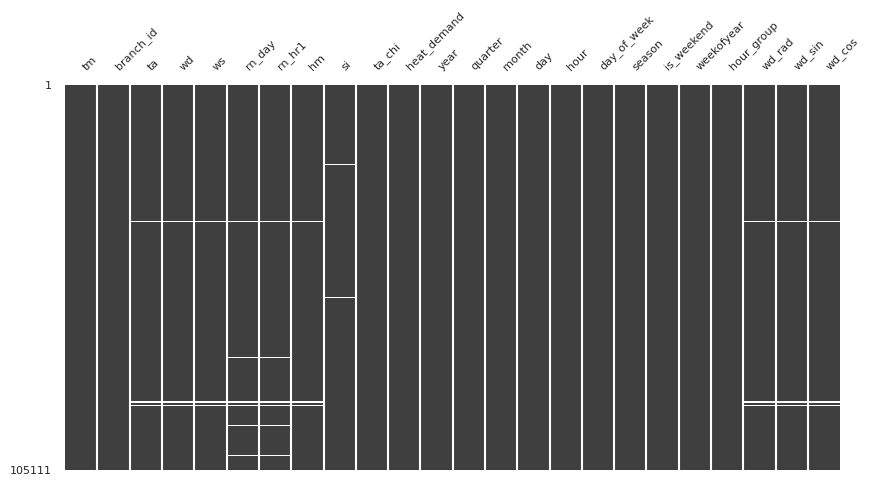

In [ ]:
import missingno as msno
# 전체 결측치 matrix 시각화
fig, ax = plt.subplots(figsize=(10, 5))
msno.matrix(cluster_3,ax=ax)
ax.tick_params(axis='x', labelsize=8)
ax.tick_params(axis='y', labelsize=8)
plt.show()

In [ ]:
cluster_3.describe()

,tm,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,heat_demand,...,quarter,month,day,hour,day_of_week,weekofyear,hour_group,wd_rad,wd_sin,wd_cos
count,105111,104131.000000,103608.000000,103608.000000,103421.000000,103317.000000,104121.000000,104862.000000,105111.000000,105111.000000,...,105111.000000,105111.000000,105111.000000,105111.000000,105111.000000,105111.0,105111.000000,103608.000000,103608.000000,103608.000000
mean,2022-07-02 12:10:53.480606464,14.652947,206.308413,1.856486,2.090096,0.159958,70.869364,0.620444,14.709172,21.932909,...,2.509614,6.526139,15.721247,11.500642,3.005375,26.571215,3.500195,3.600761,-0.108385,0.095631
min,2021-01-01 01:00:00,-19.600000,0.000000,0.000000,0.000000,0.000000,8.700000,0.000000,-22.500000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,1.0,0.000000,0.000000,-1.000000,-1.000000
25%,2021-10-01 18:00:00,6.800000,119.100000,0.800000,0.000000,0.000000,55.600000,0.000000,5.600000,8.000000,...,2.000000,4.000000,8.000000,6.000000,1.000000,14.0,2.000000,2.078687,-0.728969,-0.675590
50%,2022-07-02 12:00:00,15.800000,217.600000,1.600000,0.000000,0.000000,73.300000,0.020000,15.800000,14.000000,...,3.000000,7.000000,16.000000,12.000000,3.000000,27.0,4.000000,3.797836,-0.183951,0.273959
75%,2023-04-02 06:00:00,23.200000,306.000000,2.700000,0.000000,0.000000,89.400000,1.060000,24.800000,27.000000,...,4.000000,10.000000,23.000000,18.000000,5.000000,40.0,6.000000,5.340708,0.534352,0.795473
max,2023-12-31 23:00:00,37.600000,360.000000,11.900000,229.300000,70.300000,100.000000,3.880000,37.100000,152.000000,...,4.000000,12.000000,31.000000,23.000000,6.000000,53.0,7.000000,6.283185,1.000000,1.000000
std,NaN,10.128714,108.576899,1.426127,10.152301,1.295769,21.321440,0.922387,11.375493,20.613609,...,1.116742,3.447746,8.795959,6.921888,2.000485,15.051051,2.291201,1.895024,0.667567,0.730391


In [ ]:
cluster_3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 105111 entries, 289070 to 499301
Data columns (total 24 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   tm           105111 non-null  datetime64[ns]
 1   branch_id    105111 non-null  object        
 2   ta           104131 non-null  float64       
 3   wd           103608 non-null  float64       
 4   ws           103608 non-null  float64       
 5   rn_day       103421 non-null  float64       
 6   rn_hr1       103317 non-null  float64       
 7   hm           104121 non-null  float64       
 8   si           104862 non-null  float64       
 9   ta_chi       105111 non-null  float64       
 10  heat_demand  105111 non-null  float64       
 11  year         105111 non-null  int32         
 12  quarter      105111 non-null  int32         
 13  month        105111 non-null  int32         
 14  day          105111 non-null  int32         
 15  hour         105111 non-null  int3

In [ ]:
def plot_heat_demand_distribution(df, column_name='heat_demand', title='Distribution of Heat Demand'):
    """
    데이터프레임과 컬럼명을 받아서 평균, 중앙값, 최빈값을 계산하고
    박스플롯과 히스토그램(분포)을 그리는 함수입니다.
    """
    mean = df[column_name].mean()
    median = df[column_name].median()
    mode = df[column_name].mode()[0]

    fig, (ax_box, ax_hist) = plt.subplots(
        2, 1,
        gridspec_kw={"height_ratios": (.25, .75)},
        figsize=(12, 6),
        sharex=True
    )

    fig.suptitle(title, fontsize=18, fontweight='bold')

    # 박스플롯
    sns.boxplot(
        x=df[column_name],
        showmeans=True,
        orient='h',
        color='lightblue',
        ax=ax_box
    )
    ax_box.set(xlabel='')

    # 히스토그램 + 평균/중앙값/최빈값 선
    sns.histplot(df[column_name], bins=100, kde=True, color='skyblue', ax=ax_hist)
    ax_hist.axvline(mean, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean:.1f}')
    ax_hist.axvline(median, color='green', linestyle='-', linewidth=2, label=f'Median: {median:.1f}')
    ax_hist.axvline(mode, color='orange', linestyle='-', linewidth=2, label=f'Mode: {mode:.1f}')

    ax_hist.set_xlim(0, 150)  # x축 범위 설정
    ax_hist.set_ylim(0, 2000)  # y축 범위 설정

    ax_hist.set_xlabel(column_name, fontsize=12)
    ax_hist.set_ylabel('Frequency', fontsize=12)
    ax_hist.grid(True)
    ax_hist.legend()

    plt.tight_layout()
    plt.show()

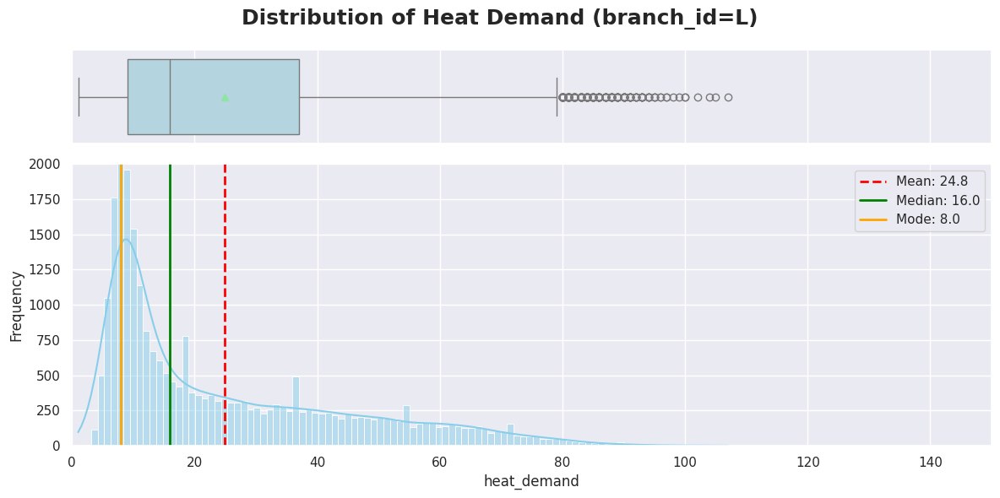

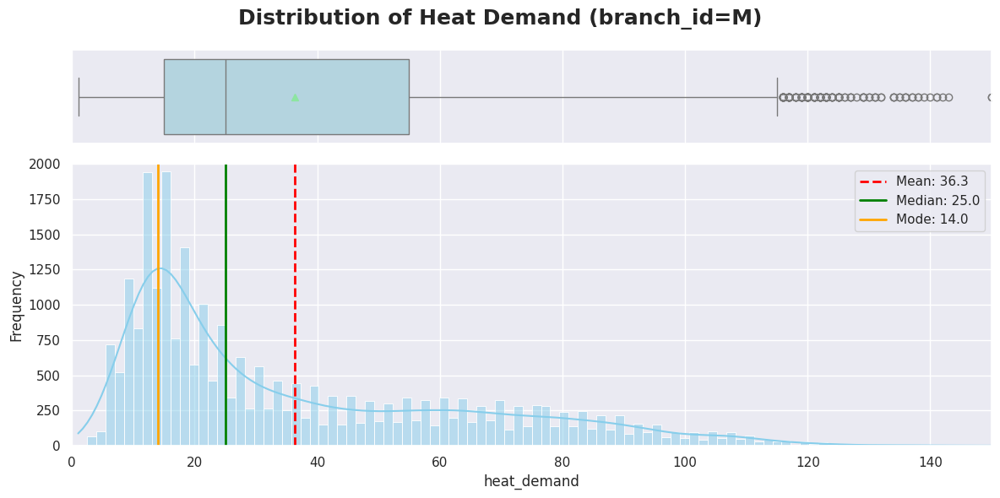

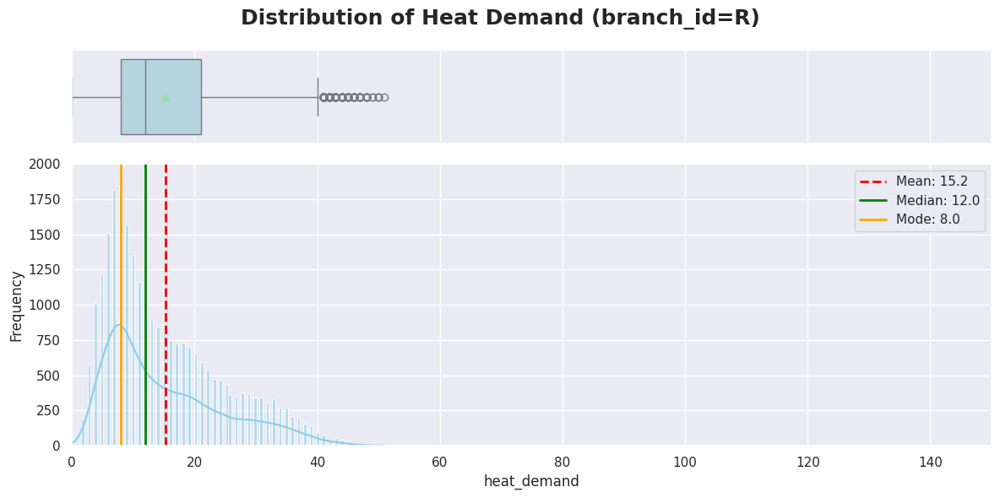

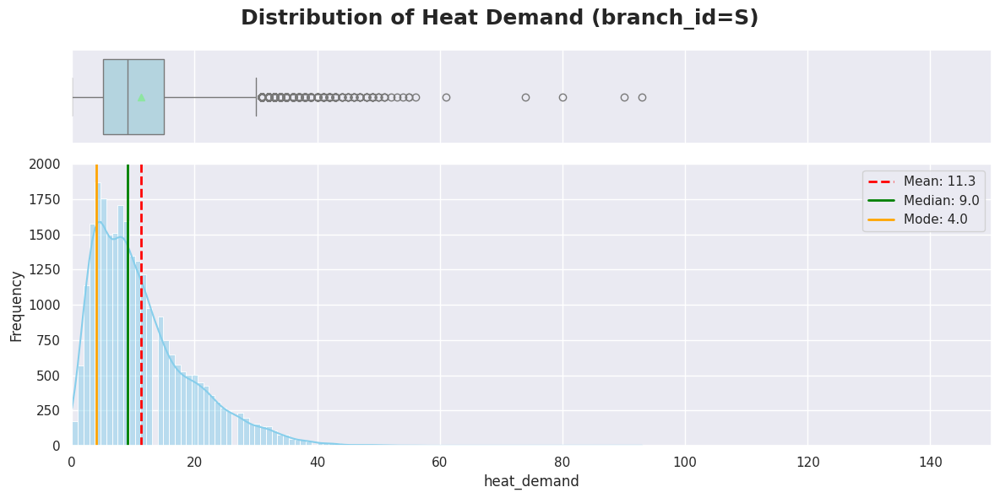

In [ ]:
# branch_id별로 분포 시각화
for branch in cluster_3['branch_id'].unique():
    temp_df = cluster_3[cluster_3['branch_id'] == branch]
    plot_heat_demand_distribution(
        temp_df,
        column_name='heat_demand',
        title=f'Distribution of Heat Demand (branch_id={branch})'
    )

대부분의 열수요는 낮지만, 소수의 높은 값들이 평균을 끌어올리고 있음.

branch L,M 은 높은 열수요가 존재하는 반면에, R,S는 낮은 열수요가 밀집되어있음. 크게 분포 X

In [ ]:
# heat_demand가 100 이상인 행만 추출
high_demand_df = cluster_3[cluster_3['heat_demand'] >= 100]

#온도가 가장 높았던 행 추출
high_demand_df[high_demand_df['ta'] == high_demand_df['ta'].max()]

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,...,day,hour,day_of_week,season,is_weekend,weekofyear,hour_group,wd_rad,wd_sin,wd_cos
315657,2021-01-13 21:00:00,M,8.4,207.1,3.3,0.0,0.0,67.7,0.0,5.6,...,13,21,2,Winter,Weekday,2,7,3.614577,-0.455545,-0.890213


In [ ]:
# 결과 확인
high_demand_df

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,...,day,hour,day_of_week,season,is_weekend,weekofyear,hour_group,wd_rad,wd_sin,wd_cos
289233,2021-01-07 20:00:00,L,-9.8,321.9,3.2,0.1,0.0,28.8,0.00,-14.1,...,7,20,3,Winter,Weekday,1,6,5.618215,-0.617036,0.786935
289234,2021-01-07 21:00:00,L,-10.3,307.6,3.4,0.1,0.0,30.1,0.00,-15.2,...,7,21,3,Winter,Weekday,1,7,5.368633,-0.792290,0.610145
289235,2021-01-07 22:00:00,L,-10.7,308.2,4.1,0.1,0.0,29.4,0.00,-16.1,...,7,22,3,Winter,Weekday,1,7,5.379105,-0.785857,0.618408
289256,2021-01-08 19:00:00,L,-7.0,314.9,3.7,0.0,0.0,37.9,0.00,-11.3,...,8,19,4,Winter,Weekday,1,6,5.496042,-0.708340,0.705872
289258,2021-01-08 21:00:00,L,-8.5,322.2,2.2,0.0,0.0,39.5,0.00,-11.5,...,8,21,4,Winter,Weekday,1,7,5.623451,-0.612907,0.790155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341529,2023-12-27 21:00:00,M,3.4,116.1,0.4,0.0,0.0,73.8,0.00,2.9,...,27,21,2,Winter,Weekday,52,7,2.026327,0.898028,-0.439939
341530,2023-12-27 22:00:00,M,2.8,330.0,0.3,0.0,0.0,78.5,0.00,2.1,...,27,22,2,Winter,Weekday,52,7,5.759587,-0.500000,0.866025
341531,2023-12-27 23:00:00,M,1.4,95.6,0.3,0.0,0.0,83.7,0.00,1.2,...,27,23,2,Winter,Weekday,52,7,1.668535,0.995227,-0.097583
341540,2023-12-28 08:00:00,M,-0.9,196.7,0.7,0.0,0.0,93.7,0.01,-1.1,...,28,8,3,Winter,Weekday,52,2,3.433063,-0.287361,-0.957822


#### 1) target분석

(1) 일별 열수요 평균

In [ ]:
daily_avg_df_cluster3 = (
    cluster_3.copy()
    .assign(date=lambda x: x['tm'].dt.date)
    .groupby('date')['heat_demand']
    .mean()
)

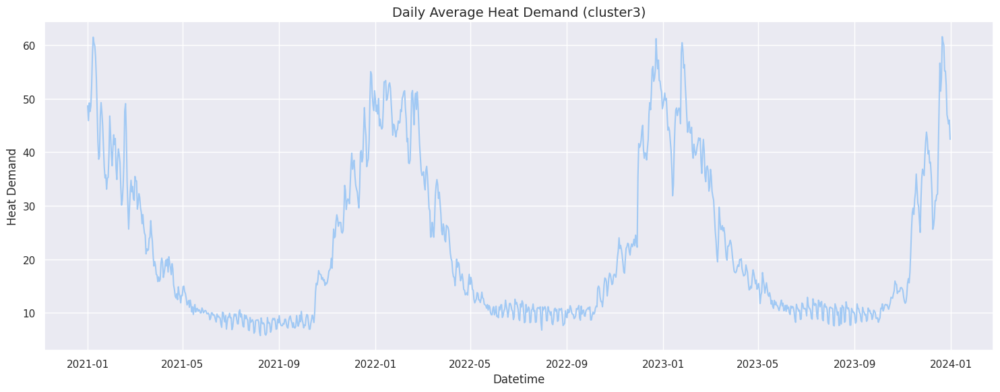

In [ ]:
# 시도표
plt.figure(figsize=(15, 6))
plt.plot(daily_avg_df_cluster3.index, daily_avg_df_cluster3.values)
plt.title('Daily Average Heat Demand (cluster3)', fontsize=14)
plt.xlabel('Datetime', fontsize=12)
plt.ylabel('Heat Demand', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

(2) 분포 시각화

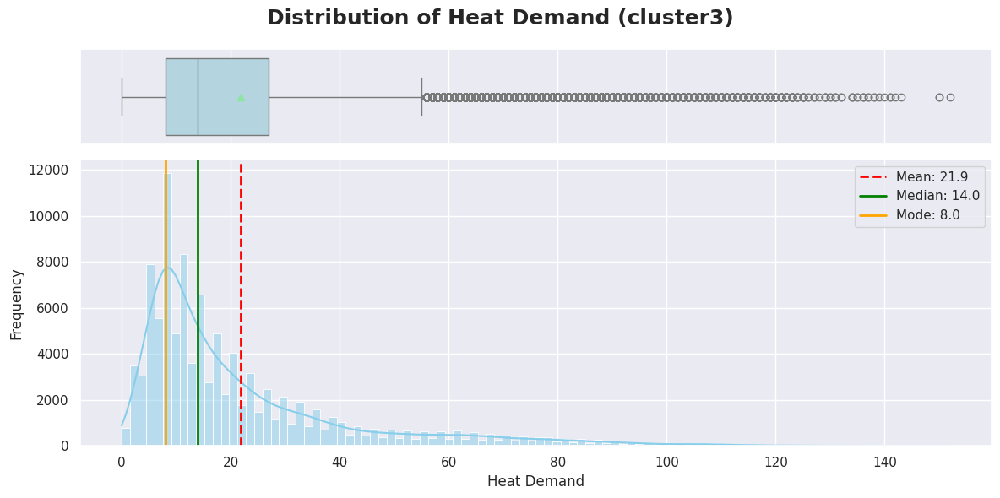

In [ ]:
# 평균, 중앙값, 최빈값 계산
mean = cluster_3['heat_demand'].mean()
median = cluster_3['heat_demand'].median()
mode = cluster_3['heat_demand'].mode()[0]

# 서브플롯 구성 (상단: 박스플롯 / 하단: 히스토그램+분포)
fig, (ax_box, ax_hist) = plt.subplots(
    2, 1,
    gridspec_kw={"height_ratios": (.25, .75)},
    figsize=(12, 6),
    sharex=True
)

fig.suptitle("Distribution of Heat Demand (cluster3)", fontsize=18, fontweight='bold')

# (1) Boxplot
sns.boxplot(
    x=cluster_3['heat_demand'],
    showmeans=True,
    orient='h',
    color='lightblue',
    ax=ax_box
)
ax_box.set(xlabel='')

# (2) Histogram + 평균/중앙값/최빈값 선
sns.histplot(cluster_3['heat_demand'], bins=100, kde=True, color='skyblue', ax=ax_hist)
ax_hist.axvline(mean, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean:.1f}')
ax_hist.axvline(median, color='green', linestyle='-', linewidth=2, label=f'Median: {median:.1f}')
ax_hist.axvline(mode, color='orange', linestyle='-', linewidth=2, label=f'Mode: {mode:.1f}')

# 축 및 범례
ax_hist.set_xlabel('Heat Demand', fontsize=12)
ax_hist.set_ylabel('Frequency', fontsize=12)
ax_hist.grid(True)
ax_hist.legend()

plt.tight_layout()
plt.show()


### STL 분해


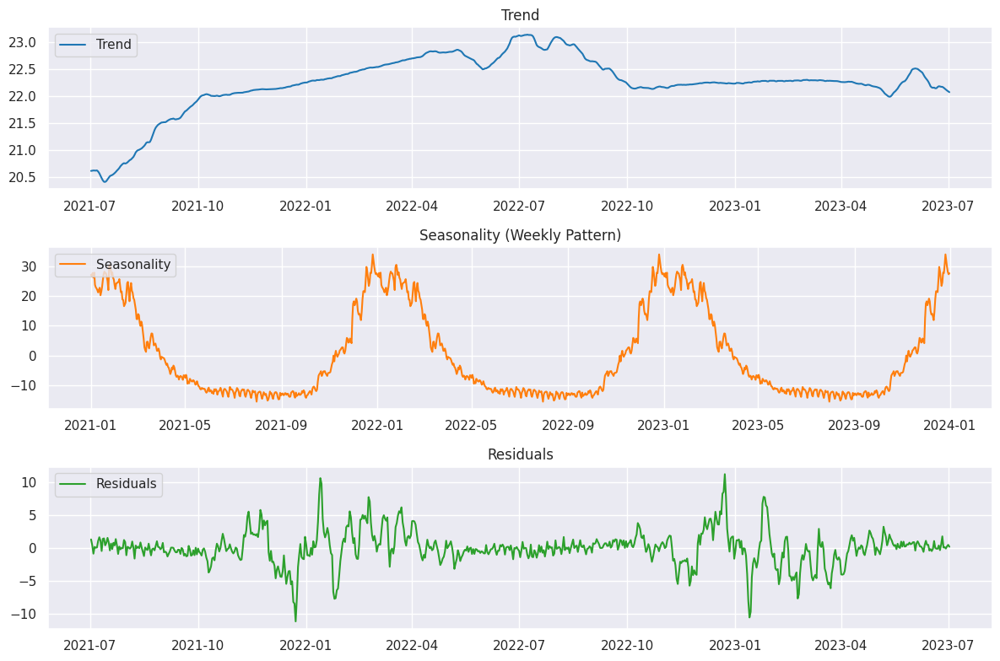

In [ ]:
# (1) 연단위 주기 파악악
result = sm.tsa.seasonal_decompose(daily_avg_df_cluster3, model='additive', period=365)

colors = plt.cm.tab10.colors
plt.figure(figsize=(12, 8))

# Trend
plt.subplot(3, 1, 1)
plt.plot(result.trend, label='Trend', color=colors[0])
plt.title('Trend')
plt.legend(loc='upper left')

# Seasonality
plt.subplot(3, 1, 2)
plt.plot(result.seasonal, label='Seasonality', color=colors[1])
plt.title('Seasonality (Weekly Pattern)')
plt.legend(loc='upper left')

# Residuals
plt.subplot(3, 1, 3)
plt.plot(result.resid, label='Residuals', color=colors[2])
plt.title('Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

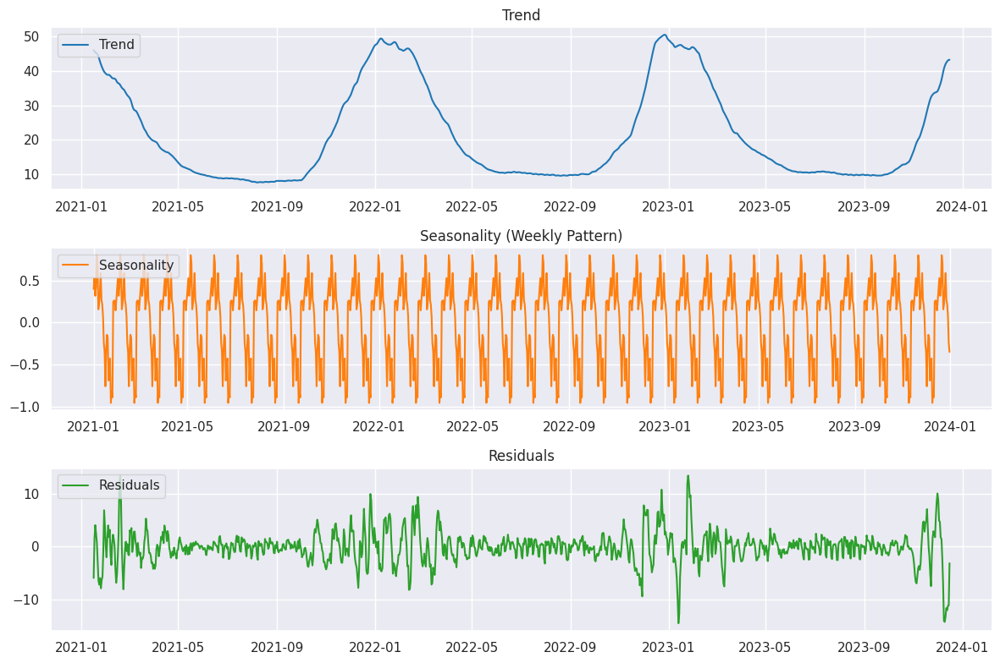

In [ ]:
#(2) 월단위 주기 파악악
result = sm.tsa.seasonal_decompose(daily_avg_df_cluster3, model='additive', period=30)

colors = plt.cm.tab10.colors
plt.figure(figsize=(12, 8))

# Trend
plt.subplot(3, 1, 1)
plt.plot(result.trend, label='Trend', color=colors[0])
plt.title('Trend')
plt.legend(loc='upper left')

# Seasonality
plt.subplot(3, 1, 2)
plt.plot(result.seasonal, label='Seasonality', color=colors[1])
plt.title('Seasonality (Weekly Pattern)')
plt.legend(loc='upper left')

# Residuals
plt.subplot(3, 1, 3)
plt.plot(result.resid, label='Residuals', color=colors[2])
plt.title('Residuals')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

### 정상성

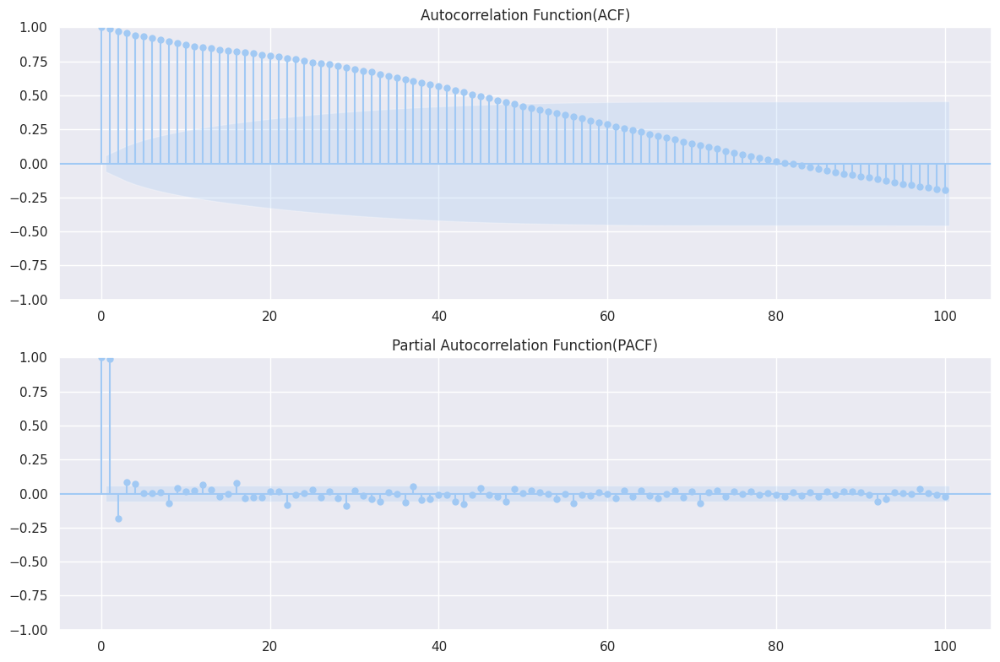

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

sm.graphics.tsa.plot_acf(daily_avg_df_cluster3, lags=100, ax=axes[0])
axes[0].set_title('Autocorrelation Function(ACF)')

sm.graphics.tsa.plot_pacf(daily_avg_df_cluster3, lags=100, ax=axes[1])
axes[1].set_title('Partial Autocorrelation Function(PACF)')

plt.tight_layout()
plt.show()

### 주별 / 월별 / 년도별 / 요일별 / 계절별 / 주말 여부 열수요 평균**

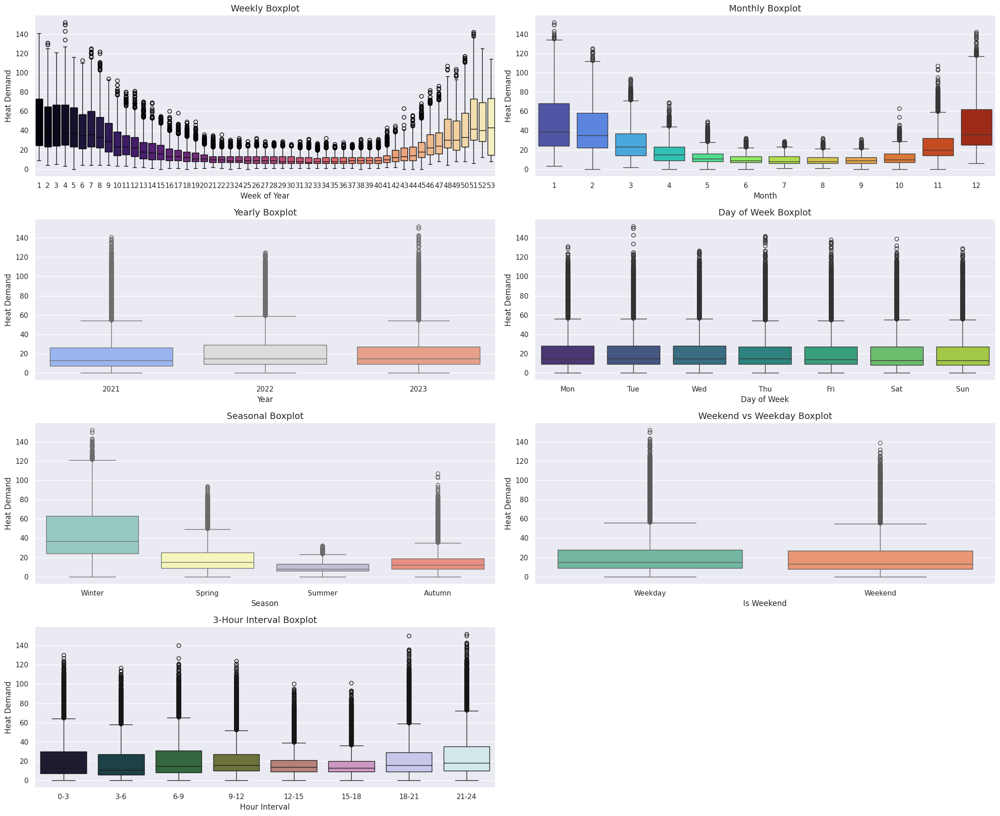

In [ ]:
# 요일 이름 매핑
weekday_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

# 플롯 설정
fig, axes = plt.subplots(4, 2, figsize=(22, 18))
plt.subplots_adjust(hspace=0.4, wspace=0.2)

# 1. 주별
sns.boxplot(x='weekofyear', y='heat_demand', data=cluster_3, ax=axes[0,0], palette='magma')
axes[0,0].set_title('Weekly Boxplot', fontsize=14)
axes[0,0].set_xlabel('Week of Year')
axes[0,0].set_ylabel('Heat Demand')

# 2. 월별
sns.boxplot(x='month', y='heat_demand', data=cluster_3, ax=axes[0,1], palette='turbo')
axes[0,1].set_title('Monthly Boxplot', fontsize=14)
axes[0,1].set_xlabel('Month')
axes[0,1].set_ylabel('Heat Demand')

# 3. 연도별
sns.boxplot(x='year', y='heat_demand', data=cluster_3, ax=axes[1,0], palette='coolwarm')
axes[1,0].set_title('Yearly Boxplot', fontsize=14)
axes[1,0].set_xlabel('Year')
axes[1,0].set_ylabel('Heat Demand')

# 4. 요일별
sns.boxplot(x='day_of_week', y='heat_demand', data=cluster_3, ax=axes[1,1], palette='viridis')
axes[1,1].set_title('Day of Week Boxplot', fontsize=14)
axes[1,1].set_xlabel('Day of Week')
axes[1,1].set_ylabel('Heat Demand')
axes[1,1].set_xticklabels(weekday_labels)

# 5. 계절별
sns.boxplot(x='season', y='heat_demand', data=cluster_3, ax=axes[2,0], palette='Set3')
axes[2,0].set_title('Seasonal Boxplot', fontsize=14)
axes[2,0].set_xlabel('Season')
axes[2,0].set_ylabel('Heat Demand')

# 6. 주말여부
sns.boxplot(x='is_weekend', y='heat_demand', data=cluster_3, ax=axes[2,1], palette='Set2')
axes[2,1].set_title('Weekend vs Weekday Boxplot', fontsize=14)
axes[2,1].set_xlabel('Is Weekend')
axes[2,1].set_ylabel('Heat Demand')

# 7. 하루를 3시간 단위로 나눈 박스플롯
sns.boxplot(x='hour_group', y='heat_demand', data=cluster_3, ax=axes[3,0], palette='cubehelix')
axes[3,0].set_title('3-Hour Interval Boxplot', fontsize=14)
axes[3,0].set_xlabel('Hour Interval')
axes[3,0].set_ylabel('Heat Demand')
axes[3,0].set_xticklabels(hour_labels)

axes[3,1].axis('off')  # 일단 비워둠

plt.tight_layout()
plt.show()


### 계절별, 시간대별 boxplot

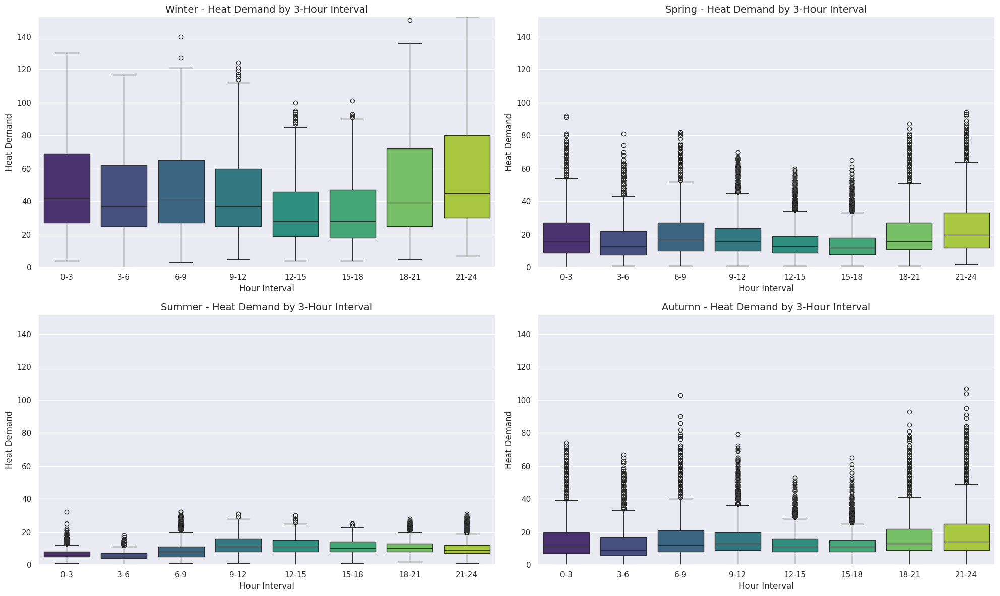

In [ ]:
# 3시간 단위 시간 그룹 레이블
hour_labels = ['0-3', '3-6', '6-9', '9-12', '12-15', '15-18', '18-21', '21-24']
cluster_3['hour_group'] = (cluster_3['tm'].dt.hour // 3).astype(int)

# 계절 순서 고정
season_order = ['Winter', 'Spring', 'Summer', 'Autumn']

# 공통 y축 범위 지정
y_min = 0
y_max = cluster_3['heat_demand'].max()

# 시각화
plt.figure(figsize=(20, 12))
for i, season in enumerate(season_order):
    plt.subplot(2, 2, i+1)
    subset = cluster_3[cluster_3['season'] == season]
    sns.boxplot(x='hour_group', y='heat_demand', data=subset, palette='viridis')
    plt.title(f'{season} - Heat Demand by 3-Hour Interval', fontsize=14)
    plt.xlabel('Hour Interval')
    plt.ylabel('Heat Demand')
    plt.xticks(ticks=range(8), labels=hour_labels)
    plt.ylim(y_min, y_max)  # Y축 고정

plt.tight_layout()
plt.show()

#### 여름 낮 시간대 브랜치별 비교

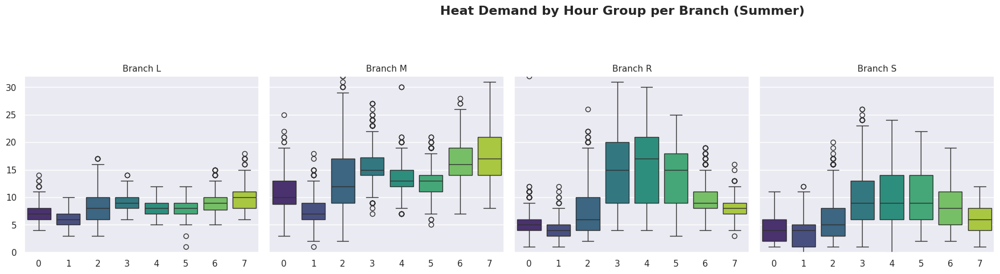

In [ ]:
# 여름철 데이터 필터링
summer_df = cluster_3[cluster_3['month'].isin([6, 7, 8])]

# 브랜치 정렬
branches = sorted(summer_df['branch_id'].unique())
n_branches = len(branches)

# 공통 y축 범위 설정 (예: 전체 여름 데이터 기준 0 ~ 200으로)
y_min = summer_df['heat_demand'].min()
y_max = summer_df['heat_demand'].max()

# subplot 설정
n_rows, n_cols = 4, 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 16), sharey=True)  # sharey로 Y축 일치
axes = axes.flatten()

# 각 지점에 대해 boxplot 그리기
for i, branch in enumerate(branches):
    ax = axes[i]
    branch_df = summer_df[summer_df['branch_id'] == branch]
    sns.boxplot(data=branch_df, x='hour_group', y='heat_demand', ax=ax, palette='viridis')
    ax.set_title(f'Branch {branch}', fontsize=11)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_ylim(y_min, y_max)  # 모든 서브플롯에 동일한 y축 설정

# 남는 subplot은 비활성화
for j in range(len(branches), len(axes)):
    fig.delaxes(axes[j])

# 전체 레이아웃 조정
plt.suptitle('Heat Demand by Hour Group per Branch (Summer)', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### 겨울철 브랜치별 비교

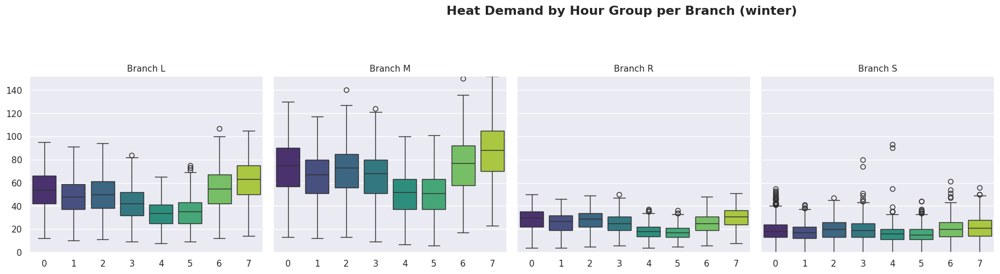

In [ ]:
# 겨울철 데이터 필터링
winter_df = cluster_3[cluster_3['month'].isin([11,12,1,2])]

# 브랜치 정렬
branches = sorted(winter_df['branch_id'].unique())
n_branches = len(branches)

# 공통 y축 범위 설정 (예: 전체 여름 데이터 기준 0 ~ 200으로)
y_min = winter_df['heat_demand'].min()
y_max = winter_df['heat_demand'].max()

# subplot 설정
n_rows, n_cols = 4, 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 16), sharey=True)  # sharey로 Y축 일치
axes = axes.flatten()

# 각 지점에 대해 boxplot 그리기
for i, branch in enumerate(branches):
    ax = axes[i]
    branch_df = winter_df[winter_df['branch_id'] == branch]
    sns.boxplot(data=branch_df, x='hour_group', y='heat_demand', ax=ax, palette='viridis')
    ax.set_title(f'Branch {branch}', fontsize=11)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_ylim(y_min, y_max)  # 모든 서브플롯에 동일한 y축 설정

# 남는 subplot은 비활성화
for j in range(len(branches), len(axes)):
    fig.delaxes(axes[j])

# 전체 레이아웃 조정
plt.suptitle('Heat Demand by Hour Group per Branch (winter)', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## feature 분석

#### (1) branch id별

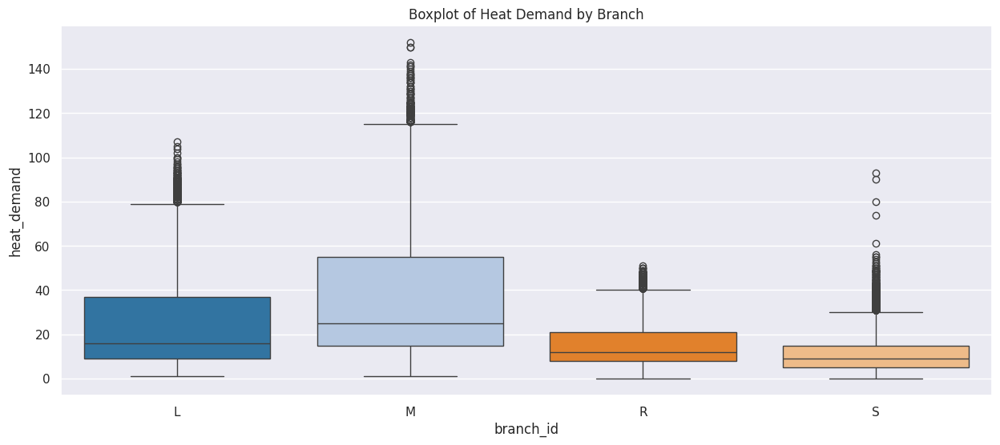

In [ ]:
#지사별 열수요
plt.figure(figsize=(15,6))
sns.boxplot(x='branch_id', y='heat_demand', data=cluster_3, palette='tab20')
plt.title('Boxplot of Heat Demand by Branch')
plt.show()

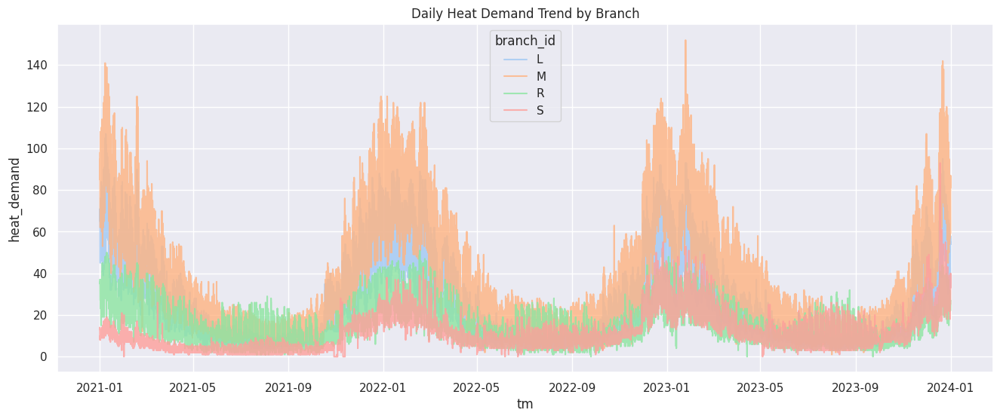

In [ ]:
#브랜치별 시간에 따른 평균 열수요
daily_branch_avg = cluster_3.groupby(['tm', 'branch_id'])['heat_demand'].mean().reset_index()
plt.figure(figsize=(16,6))
sns.lineplot(data=daily_branch_avg, x='tm', y='heat_demand', hue='branch_id', alpha=0.8)
plt.title('Daily Heat Demand Trend by Branch')
plt.show()

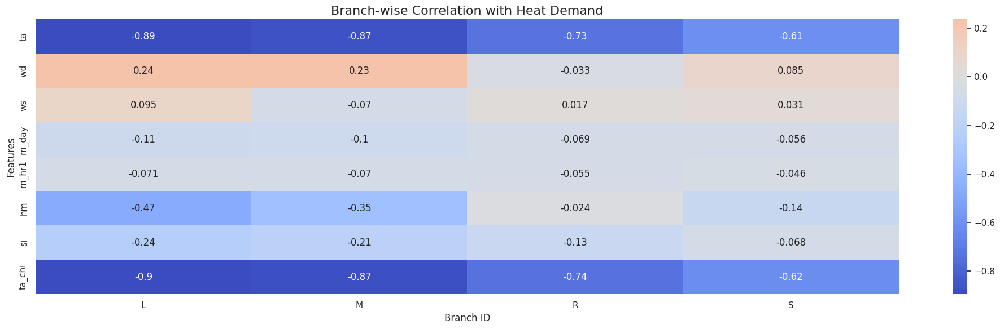

In [ ]:
#브랜치별 열수요 상관관계
numeric_features = ['ta', 'wd', 'ws', 'rn_day', 'rn_hr1', 'hm', 'si', 'ta_chi']

corr_list = []
branch_ids = cluster_3['branch_id'].unique()

for b in branch_ids:
    df_branch = cluster_3[cluster_3['branch_id'] == b]
    corr = df_branch[numeric_features + ['heat_demand']].corr()['heat_demand'].drop('heat_demand')
    corr_list.append(corr)

# 데이터프레임 형태로 변환
corr_df = pd.concat(corr_list, axis=1)
corr_df.columns = branch_ids

# 시각화
plt.figure(figsize=(20, 6))
sns.heatmap(corr_df, cmap='coolwarm', center=0, annot=True)
plt.title('Branch-wise Correlation with Heat Demand', fontsize=16)
plt.xlabel('Branch ID')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

### (2) 온도(ta)

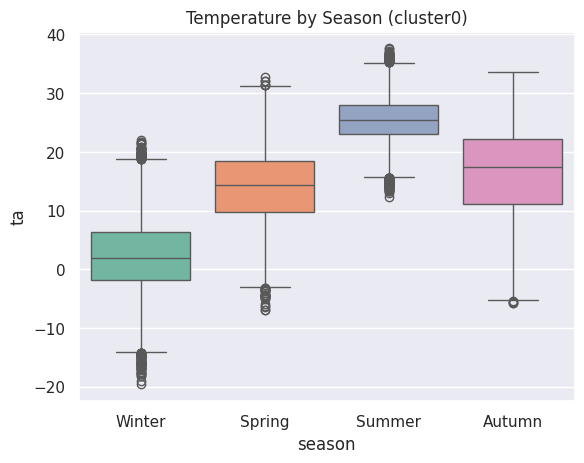

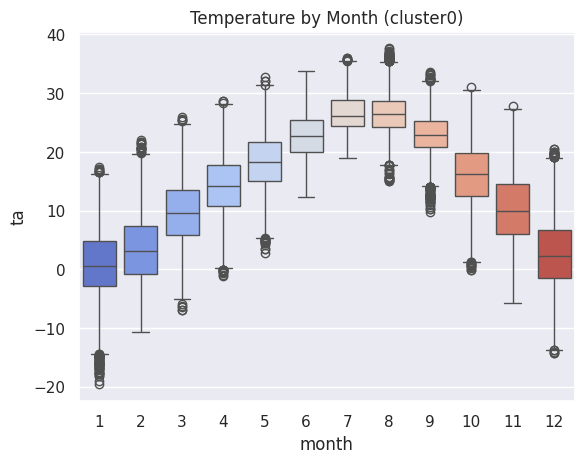

In [ ]:
# 계절별
sns.boxplot(x='season', y='ta', data=cluster_3, palette='Set2', order=['Winter', 'Spring', 'Summer', 'Autumn'])
plt.title('Temperature by Season (cluster3)')
plt.show()

# 월별
sns.boxplot(x='month', y='ta', data=cluster_3, palette='coolwarm')
plt.title('Temperature by Month (cluster3)')
plt.show()

Text(0.5, 0.98, 'Heat Demand vs Temperature by Branch (cluster0)')

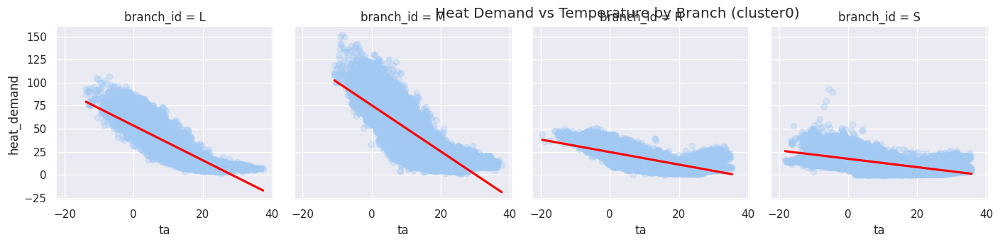

In [ ]:
#지점별 기온과 열수요관계
g = sns.lmplot(data=cluster_3, x='ta', y='heat_demand', col='branch_id', col_wrap=5,
               scatter_kws={'alpha':0.3}, line_kws={'color':'red'}, height=3.5, aspect=1)
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Heat Demand vs Temperature by Branch (cluster3)')

### (3) 풍향 (wd)

In [ ]:
cluster_3['wd']

,wd
289070,317.5
289071,325.8
289072,17.2
289073,333.8
289074,346.3
...,...
499297,233.5
499298,227.4
499299,360.0
499300,30.0


### (5) rn_day

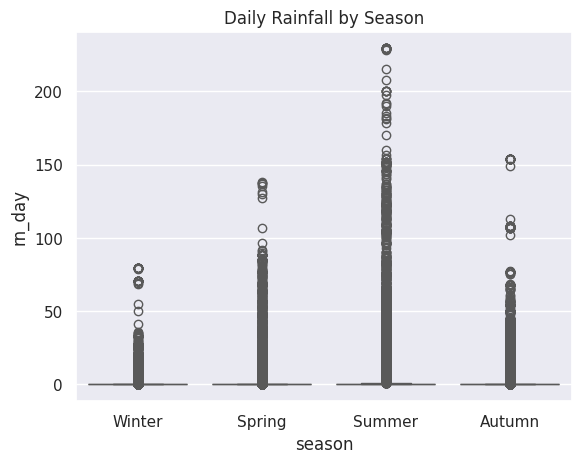

In [ ]:
sns.boxplot(x='season', y='rn_day', data=cluster_3, palette='Set2', order=['Winter', 'Spring', 'Summer', 'Autumn'])
plt.title('Daily Rainfall by Season')
plt.show()

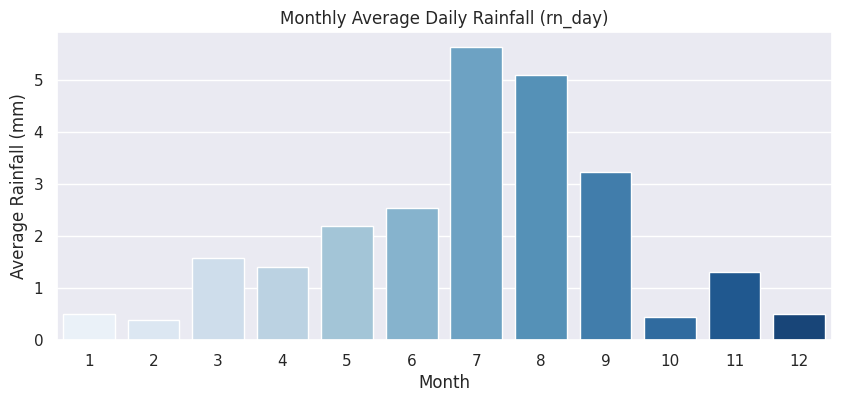

In [ ]:
#월별 강수량 차이
monthly_rain = cluster_3.groupby('month')['rn_day'].mean()
plt.figure(figsize=(10, 4))
sns.barplot(x=monthly_rain.index, y=monthly_rain.values, palette='Blues')
plt.title('Monthly Average Daily Rainfall (rn_day)')
plt.xlabel('Month')
plt.ylabel('Average Rainfall (mm)')
plt.show()

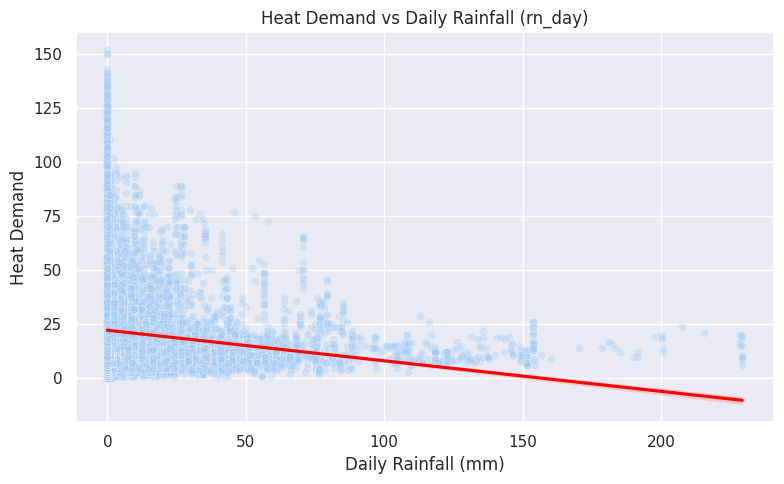

In [ ]:
#강수량과 열수요 관계
plt.figure(figsize=(8, 5))
sns.scatterplot(x='rn_day', y='heat_demand', data=cluster_3, alpha=0.3)
sns.regplot(x='rn_day', y='heat_demand', data=cluster_3, scatter=False, color='red')
plt.title('Heat Demand vs Daily Rainfall (rn_day)')
plt.xlabel('Daily Rainfall (mm)')
plt.ylabel('Heat Demand')
plt.grid(True)
plt.tight_layout()
plt.show()

### (6) hm

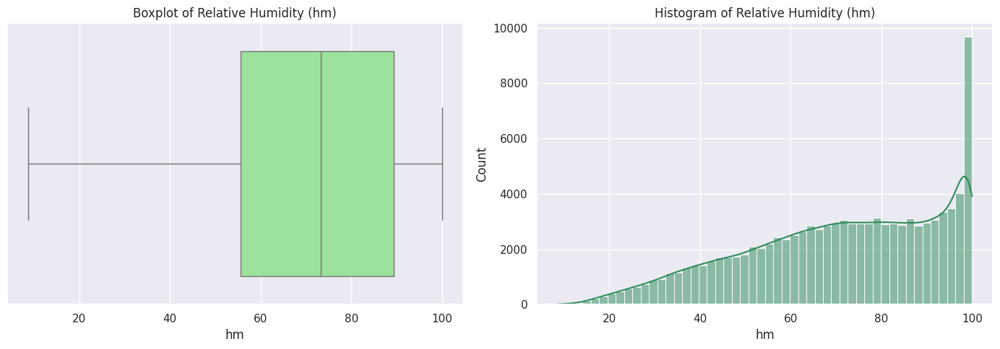

In [ ]:
plt.figure(figsize=(14, 5))

# Boxplot
plt.subplot(1, 2, 1)
sns.boxplot(x=cluster_3['hm'], color='lightgreen')
plt.title('Boxplot of Relative Humidity (hm)')

# Histogram
plt.subplot(1, 2, 2)
sns.histplot(cluster_3['hm'], bins=50, kde=True, color='seagreen')
plt.title('Histogram of Relative Humidity (hm)')

plt.tight_layout()
plt.show()


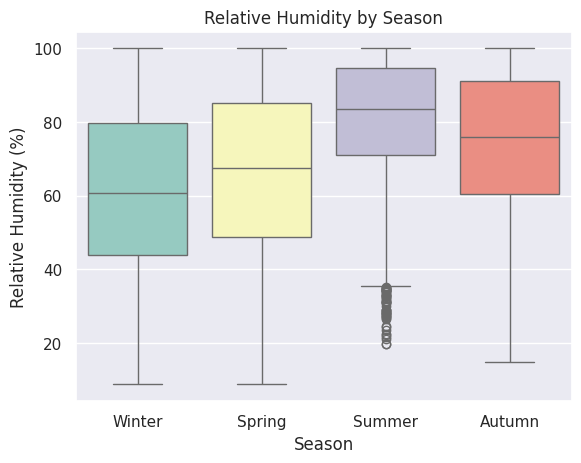

In [ ]:
#계절별 습도
sns.boxplot(x='season', y='hm', data=cluster_3, palette='Set3', order=['Winter', 'Spring', 'Summer', 'Autumn'])
plt.title('Relative Humidity by Season')
plt.xlabel('Season')
plt.ylabel('Relative Humidity (%)')
plt.show()

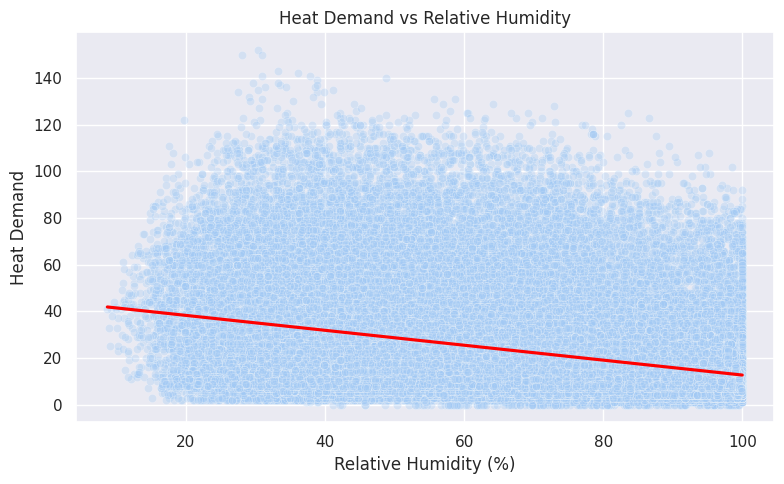

In [ ]:
#열수요와 습도관계
plt.figure(figsize=(8, 5))
sns.scatterplot(x='hm', y='heat_demand', data=cluster_3, alpha=0.3)
sns.regplot(x='hm', y='heat_demand', data=cluster_3, scatter=False, color='red')
plt.title('Heat Demand vs Relative Humidity')
plt.xlabel('Relative Humidity (%)')
plt.ylabel('Heat Demand')
plt.grid(True)
plt.tight_layout()
plt.show()


### (7) si

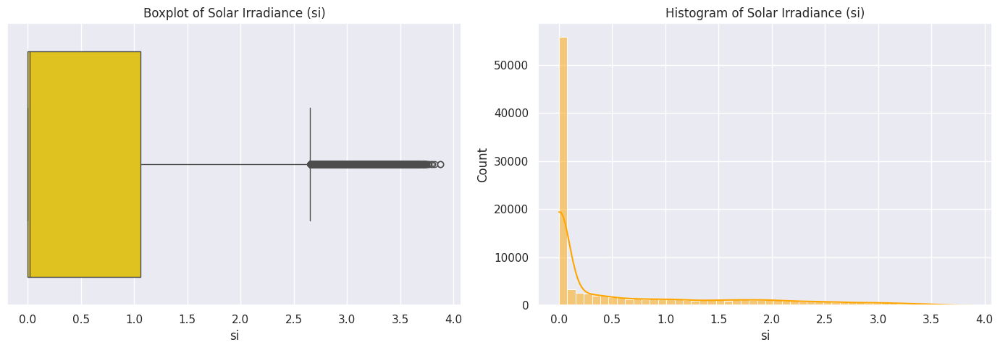

In [ ]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.boxplot(x=cluster_3['si'], color='gold')
plt.title('Boxplot of Solar Irradiance (si)')

plt.subplot(1, 2, 2)
sns.histplot(cluster_3['si'], bins=50, kde=True, color='orange')
plt.title('Histogram of Solar Irradiance (si)')

plt.tight_layout()
plt.show()

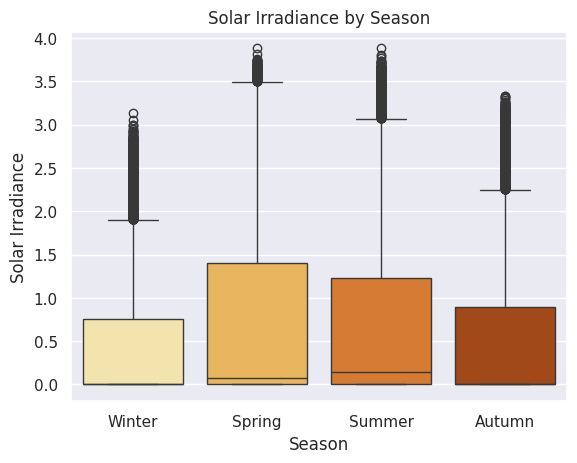

In [ ]:
#계절별별
sns.boxplot(x='season', y='si', data=cluster_3, palette='YlOrBr', order=['Winter', 'Spring', 'Summer', 'Autumn'])
plt.title('Solar Irradiance by Season')
plt.xlabel('Season')
plt.ylabel('Solar Irradiance')
plt.show()

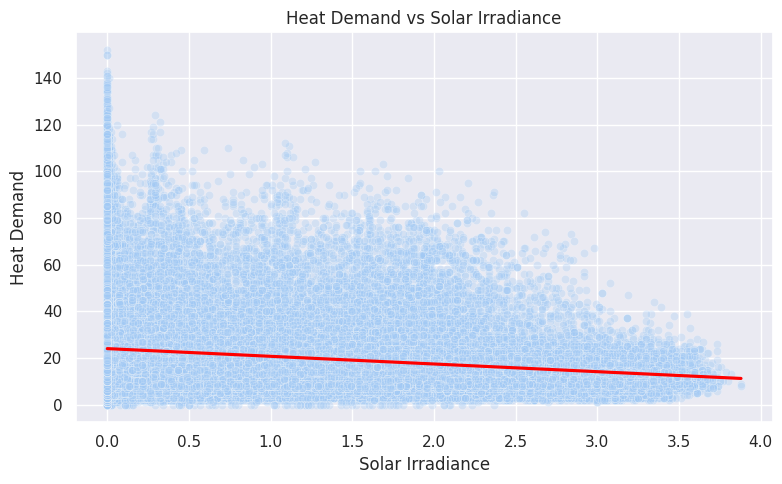

In [ ]:
#열수요와 일사량
plt.figure(figsize=(8, 5))
sns.scatterplot(x='si', y='heat_demand', data=cluster_3, alpha=0.3)
sns.regplot(x='si', y='heat_demand', data=cluster_3, scatter=False, color='red')
plt.title('Heat Demand vs Solar Irradiance')
plt.xlabel('Solar Irradiance')
plt.ylabel('Heat Demand')
plt.grid(True)
plt.tight_layout()
plt.show()

Text(0.5, 0.98, 'Heat Demand vs si by Branch')

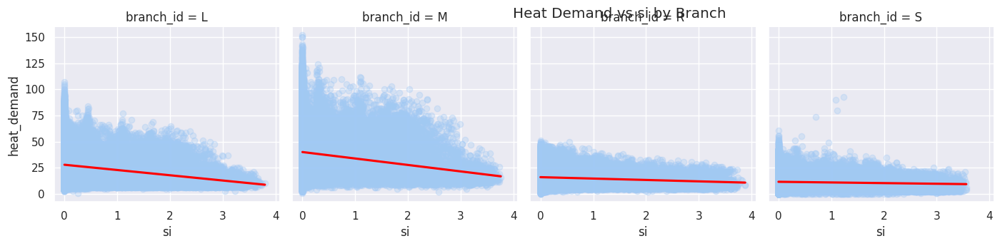

In [ ]:
#지사별 열수요와 일사량
g = sns.lmplot(data=cluster_3, x='si', y='heat_demand', col='branch_id', col_wrap=5,
               scatter_kws={'alpha':0.3}, line_kws={'color':'red'}, height=3.5, aspect=1)
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Heat Demand vs si by Branch')

### (8) ta_chi

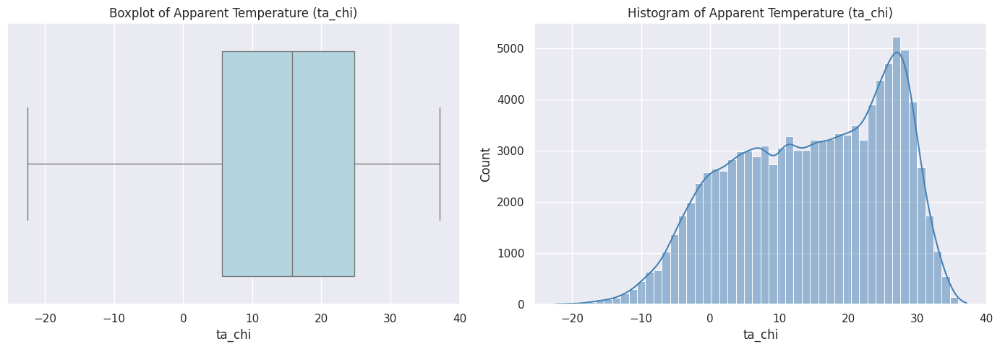

In [ ]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.boxplot(x=cluster_3['ta_chi'], color='lightblue')
plt.title('Boxplot of Apparent Temperature (ta_chi)')

plt.subplot(1, 2, 2)
sns.histplot(cluster_3['ta_chi'], bins=50, kde=True, color='steelblue')
plt.title('Histogram of Apparent Temperature (ta_chi)')

plt.tight_layout()
plt.show()

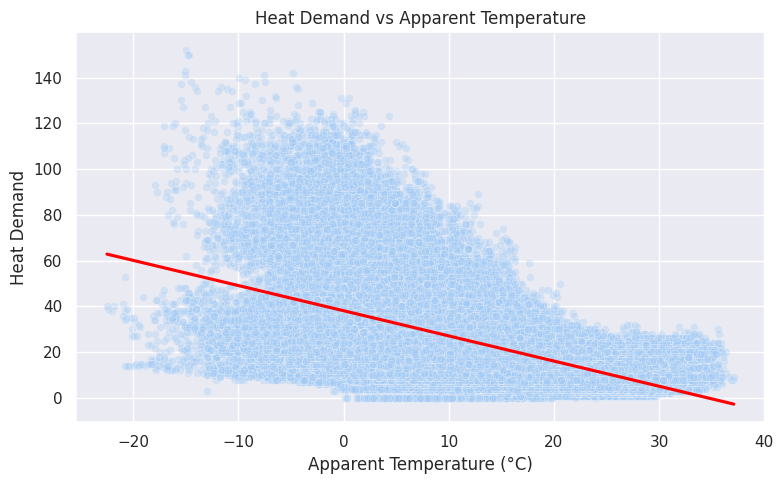

In [ ]:
#체감온도와 열수요 관계
plt.figure(figsize=(8, 5))
sns.scatterplot(x='ta_chi', y='heat_demand', data=cluster_3, alpha=0.3)
sns.regplot(x='ta_chi', y='heat_demand', data=cluster_3, scatter=False, color='red')
plt.title('Heat Demand vs Apparent Temperature')
plt.xlabel('Apparent Temperature (°C)')
plt.ylabel('Heat Demand')
plt.grid(True)
plt.tight_layout()
plt.show()

Text(0.5, 0.98, 'Heat Demand vs Apparent Temperature by Branch')

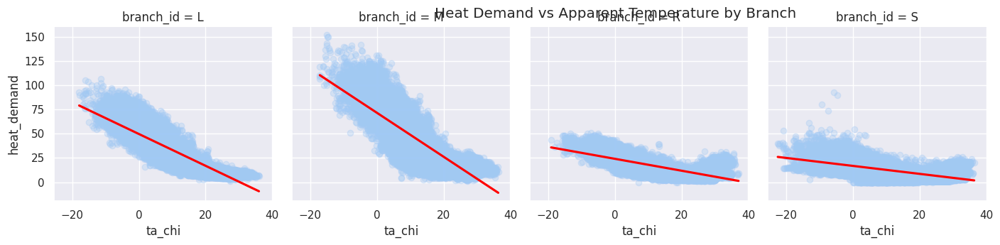

In [ ]:
#지사별, 체감온도와 열수요 관계
g = sns.lmplot(data=cluster_3, x='ta_chi', y='heat_demand', col='branch_id', col_wrap=5,
               scatter_kws={'alpha':0.3}, line_kws={'color':'red'}, height=3.5, aspect=1)
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Heat Demand vs Apparent Temperature by Branch')

-------------

<Axes: xlabel='branch_id'>

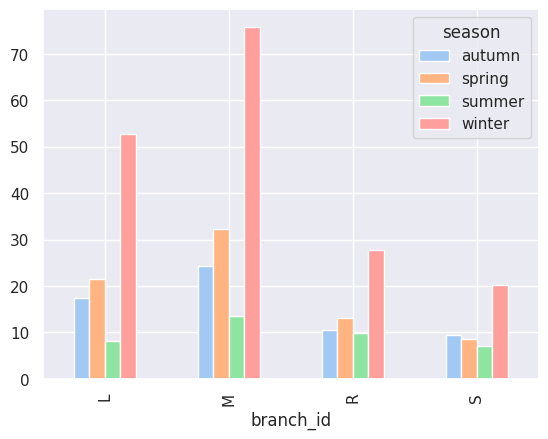

In [ ]:
# 예시: 계절 + 지사별 평균 열수요

# 계절 구분: 1=봄, 2=여름, 3=가을, 4=겨울
cluster_3['season'] = cluster_3['tm'].dt.month % 12 // 3 + 1

# 숫자 계절을 문자로 매핑
season_map = {
    1: 'winter',
    2: 'spring',
    3: 'summer',
    4: 'autumn'
}
cluster_3['season'] = cluster_3['season'].map(season_map)

# 지사별, 계절별 평균 열수요 시각화
cluster_3.groupby(['branch_id', 'season'])['heat_demand'].mean().unstack().plot(kind='bar')


In [ ]:
# 기온과 지사별 평균 열수요 관계를 확인
grouped = cluster_3.groupby(['ta', 'branch_id'])['heat_demand'].mean().reset_index()

# 전체 기온별 평균 및 표준편차 계산
ta_stats = cluster_3.groupby('ta')['heat_demand'].agg(['mean', 'std']).reset_index()
ta_stats.rename(columns={'mean': 'overall_mean', 'std': 'overall_std'}, inplace=True)

# 병합하여 이상값 판단
merged = pd.merge(grouped, ta_stats, on='ta')

# z-score 계산
merged['z_score'] = (merged['heat_demand'] - merged['overall_mean']) / merged['overall_std']

# 이상값 추출 (z > 2.5 이상이면 의심)
outliers = merged[merged['z_score'] > 2.5].sort_values('z_score', ascending=False)

# 결과 출력
print(outliers[['ta', 'branch_id', 'heat_demand', 'z_score']])


       ta branch_id  heat_demand   z_score
221  -8.0         M   150.000000  4.568534
197  -8.6         M   152.000000  4.220291
170  -9.3         M   137.000000  4.004496
181  -9.0         L   100.000000  3.757150
205  -8.4         M   138.000000  3.552023
231  -7.7         M   116.000000  3.519259
174  -9.2         M   113.000000  3.375640
262  -6.9         M   118.000000  3.233459
140 -10.1         M   117.000000  3.205861
158  -9.6         M   119.000000  3.197138
250  -7.2         M   102.500000  3.118601
201  -8.5         M   118.000000  2.995984
217  -8.1         M   120.000000  2.988644
189  -8.8         M   103.000000  2.893181
193  -8.7         M   115.000000  2.889890
227  -7.8         L    84.500000  2.848704
144 -10.0         M   105.000000  2.823330
115 -10.8         M   109.500000  2.791027
150  -9.8         M   102.000000  2.749727
266  -6.8         M   101.500000  2.711825
107 -11.1         L    92.000000  2.675294
178  -9.1         M   126.000000  2.674659
149  -9.8  

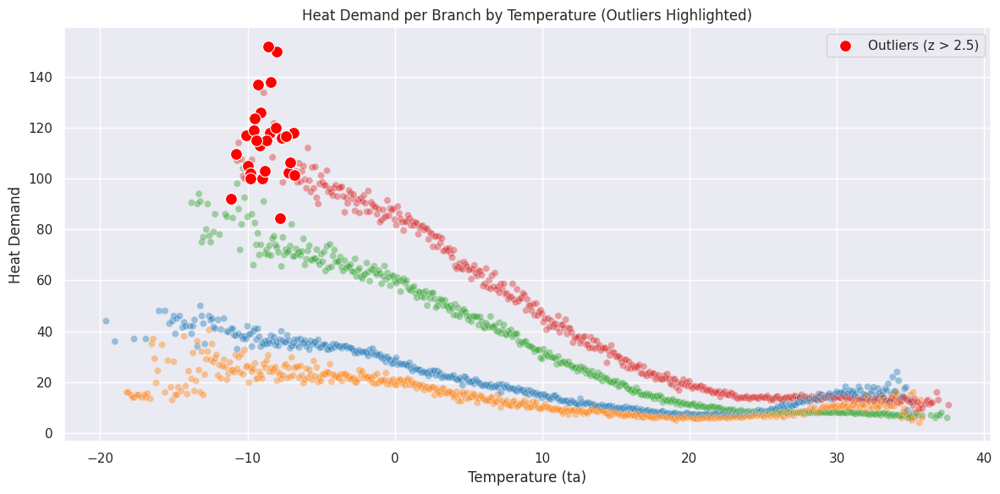

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))

# 전체 지점 데이터 산점도 (연한 회색)
sns.scatterplot(data=merged, x='ta', y='heat_demand', hue='branch_id', palette='tab10', alpha=0.4, legend=False)

# 이상값만 빨간 점으로 표시
sns.scatterplot(data=outliers, x='ta', y='heat_demand', color='red', s=100, label='Outliers (z > 2.5)')

plt.title('Heat Demand per Branch by Temperature (Outliers Highlighted)')
plt.xlabel('Temperature (ta)')
plt.ylabel('Heat Demand')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


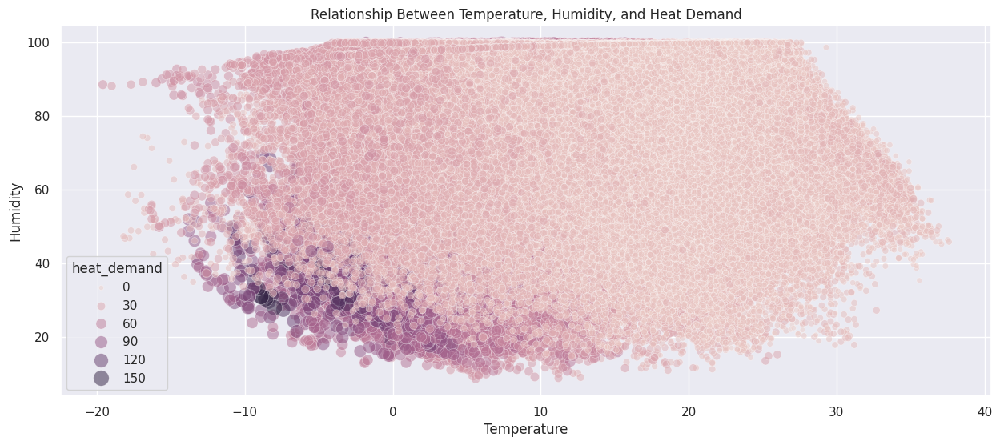

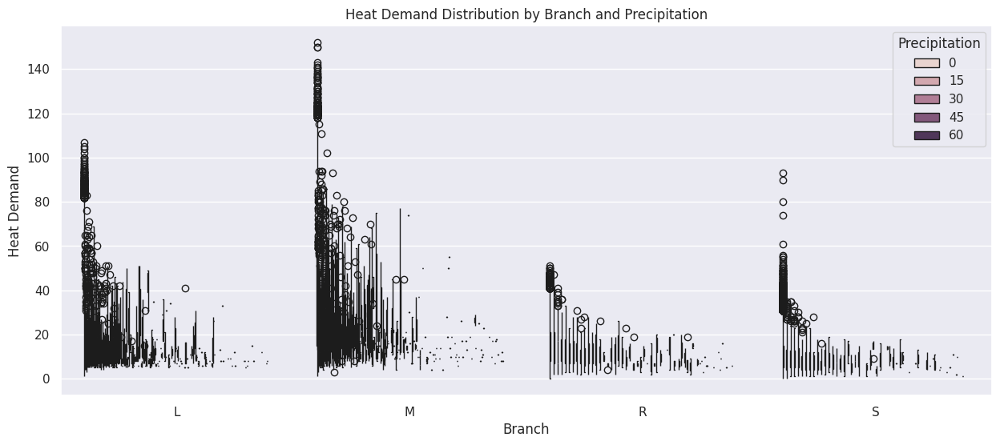

In [ ]:
# 기온과 습도의 복합 효과
plt.figure(figsize=(15, 6))
sns.scatterplot(data=cluster_3, x='ta', y='hm', hue='heat_demand',
                size='heat_demand', sizes=(20, 200), alpha=0.5)
plt.title('Relationship Between Temperature, Humidity, and Heat Demand')
plt.xlabel('Temperature')
plt.ylabel('Humidity')
plt.show()


# 강수량과 열수요의 관계
plt.figure(figsize=(15, 6))
sns.boxplot(data=cluster_3, x='branch_id', y='heat_demand', hue='rn_hr1')
plt.title('Heat Demand Distribution by Branch and Precipitation')
plt.xlabel('Branch')
plt.ylabel('Heat Demand')
plt.legend(title='Precipitation')
plt.show()


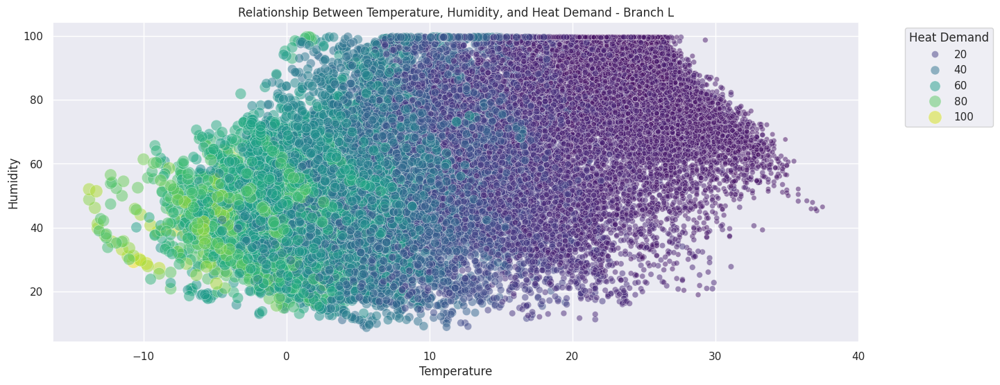

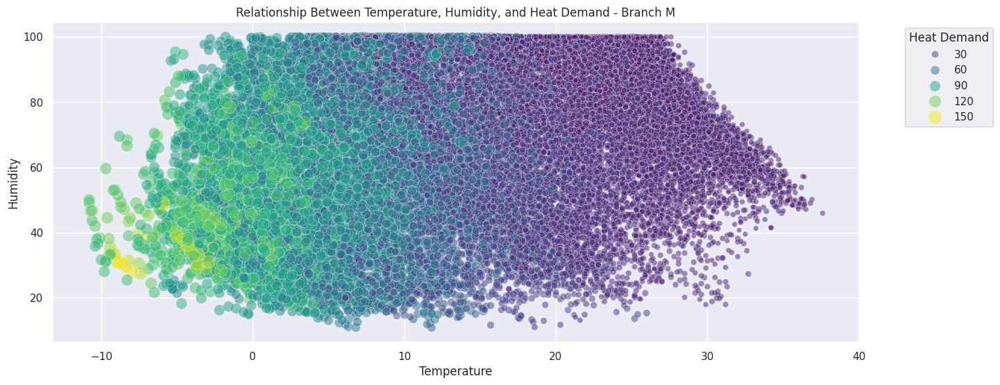

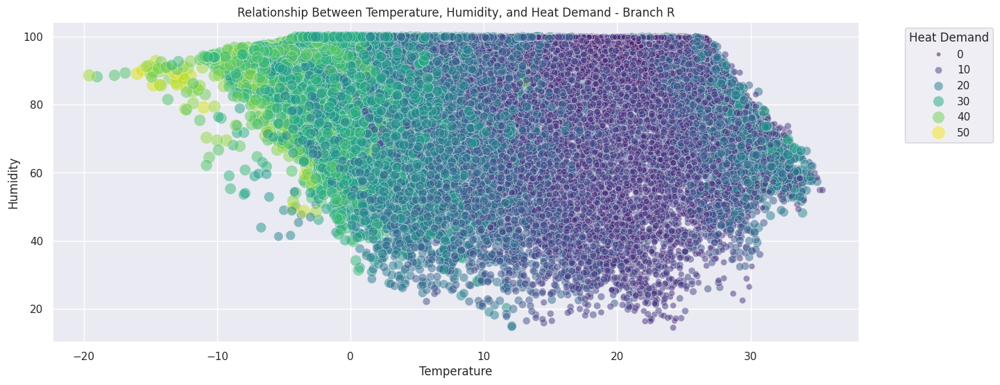

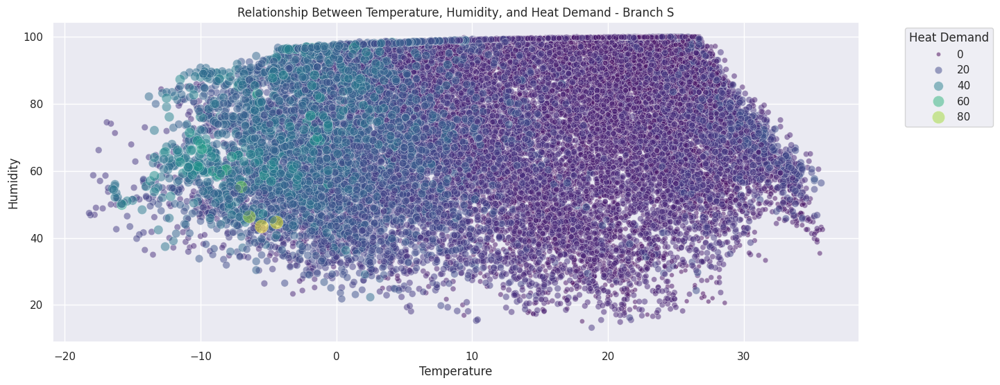

In [ ]:
branches = ['L', 'M', 'R', 'S']

for branch in branches:
    branch_data = cluster_3[cluster_3['branch_id'] == branch]

    plt.figure(figsize=(15, 6))
    sns.scatterplot(
        data=branch_data,
        x='ta', y='hm',
        hue='heat_demand',
        size='heat_demand', sizes=(20, 200), alpha=0.5,
        palette='viridis'
    )
    plt.title(f'Relationship Between Temperature, Humidity, and Heat Demand - Branch {branch}')
    plt.xlabel('Temperature')
    plt.ylabel('Humidity')
    plt.legend(title='Heat Demand', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


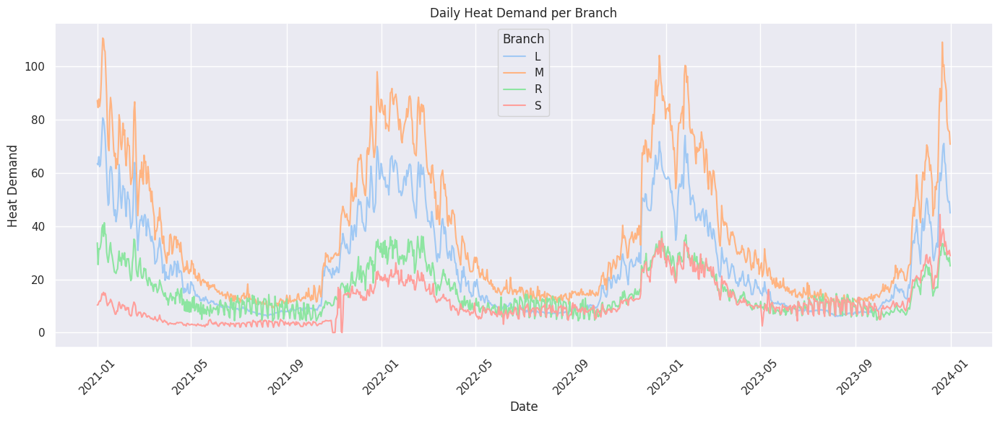

In [ ]:
# 일자 단위 추출
cluster_3['date'] = cluster_3['tm'].dt.date

# 일별, 지사별 평균 열수요 집계
daily_demand = cluster_3.groupby(['date', 'branch_id'])['heat_demand'].mean().reset_index()

# 시각화
plt.figure(figsize=(14, 6))
sns.lineplot(data=daily_demand, x='date', y='heat_demand', hue='branch_id')
plt.title('Daily Heat Demand per Branch')
plt.xlabel('Date')
plt.ylabel('Heat Demand')
plt.xticks(rotation=45)
plt.legend(title='Branch')
plt.tight_layout()
plt.show()


In [ ]:
cluster_3['heat_demand']

,heat_demand
289070,70.0
289071,69.0
289072,68.0
289073,65.0
289074,66.0
...,...
499297,34.0
499298,35.0
499299,35.0
499300,40.0


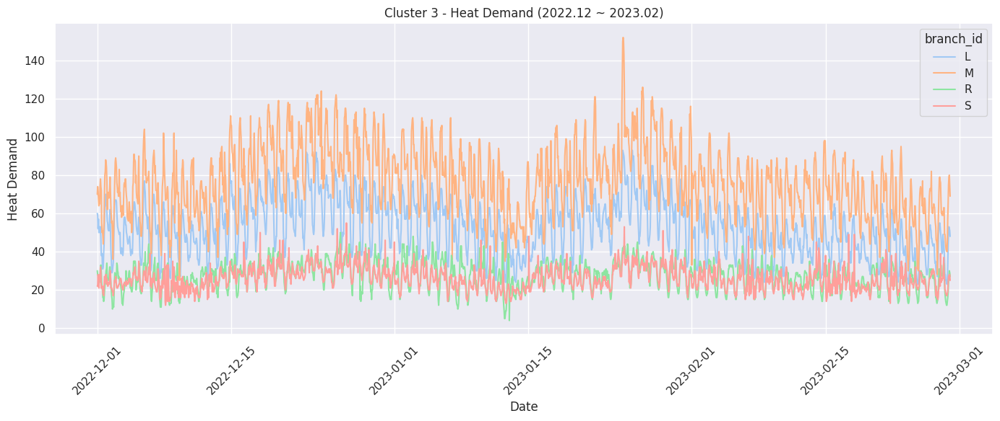

In [ ]:
## 왜 2023-02쯤에 확줄엇다가 다시 올랐을까??
# 특정 기간만 필터링 (급감 시기 포함)
mask = (cluster_3["tm"] >= "2022-12-01") & (cluster_3["tm"] <= "2023-02-28")
subset = cluster_3[mask]

# 시각화
plt.figure(figsize=(14, 6))
sns.lineplot(data=subset, x="tm", y="heat_demand", hue="branch_id")
plt.title("Cluster 3 - Heat Demand (2022.12 ~ 2023.02)")
plt.xlabel("Date")
plt.ylabel("Heat Demand")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

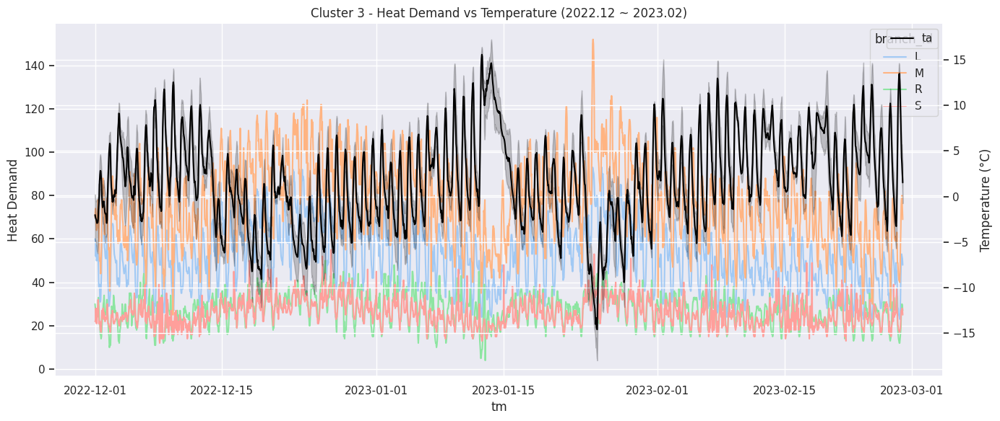

In [ ]:
# 온도와 함께 그리기 (보조축 사용)
fig, ax1 = plt.subplots(figsize=(14,6))

sns.lineplot(data=subset, x="tm", y="heat_demand", hue="branch_id", ax=ax1)
ax1.set_ylabel("Heat Demand")
ax1.set_title("Cluster 3 - Heat Demand vs Temperature (2022.12 ~ 2023.02)")

# 온도 보조축
ax2 = ax1.twinx()
sns.lineplot(data=subset, x="tm", y="ta", color="black", label="ta", ax=ax2)
ax2.set_ylabel("Temperature (°C)")

plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
plt.show()

In [ ]:
# 각 branch별로 회귀계수 추정
import statsmodels.api as sm

for branch in cluster_3['branch_id'].unique():
    temp_df = cluster_3[cluster_3['branch_id'] == branch][['heat_demand', 'ta']].dropna()

    # 결측치가 제거된 데이터가 충분할 경우에만 분석
    if len(temp_df) > 10:
        X = sm.add_constant(temp_df['ta'])
        y = temp_df['heat_demand']
        model = sm.OLS(y, X).fit()
        print(f"Branch: {branch} | TA 계수: {model.params['ta']:.4f}")
    else:
        print(f"Branch: {branch} | 데이터 부족으로 분석 생략")

Branch: L | TA 계수: -1.8773
Branch: M | TA 계수: -2.5041
Branch: R | TA 계수: -0.6793
Branch: S | TA 계수: -0.4541


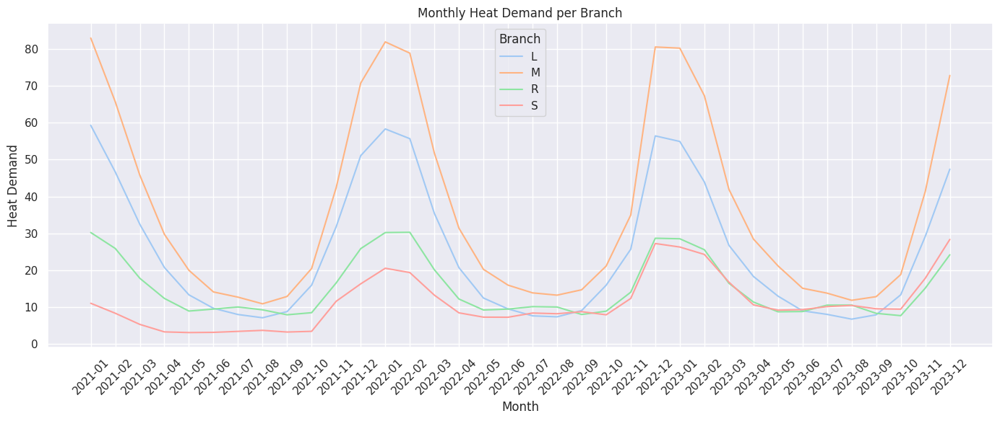

In [ ]:
# 월 단위 추출
cluster_3['month'] = cluster_3['tm'].dt.to_period('M')

# 'month' 컬럼을 문자열로 변환
monthly_demand['month'] = monthly_demand['month'].astype(str)

# 시각화
plt.figure(figsize=(14, 6))
sns.lineplot(data=monthly_demand, x='month', y='heat_demand', hue='branch_id')
plt.title('Monthly Heat Demand per Branch')
plt.xlabel('Month')
plt.ylabel('Heat Demand')
plt.xticks(rotation=45)
plt.legend(title='Branch')
plt.tight_layout()
plt.show()



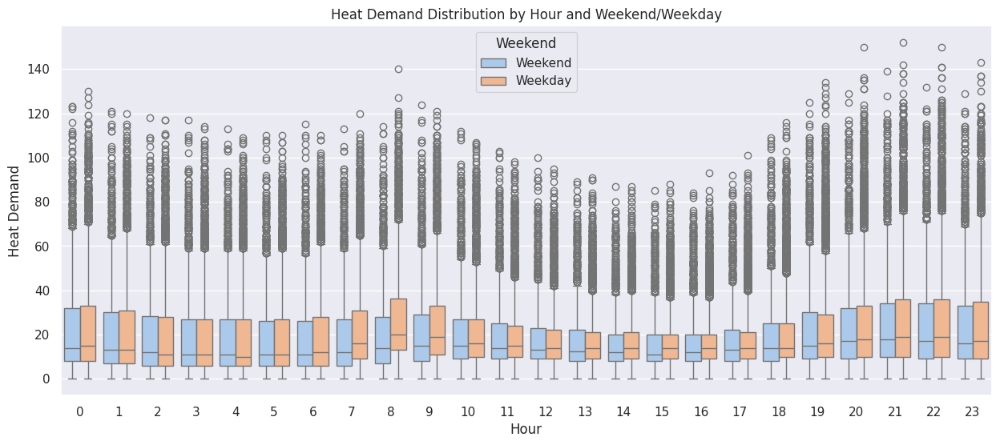

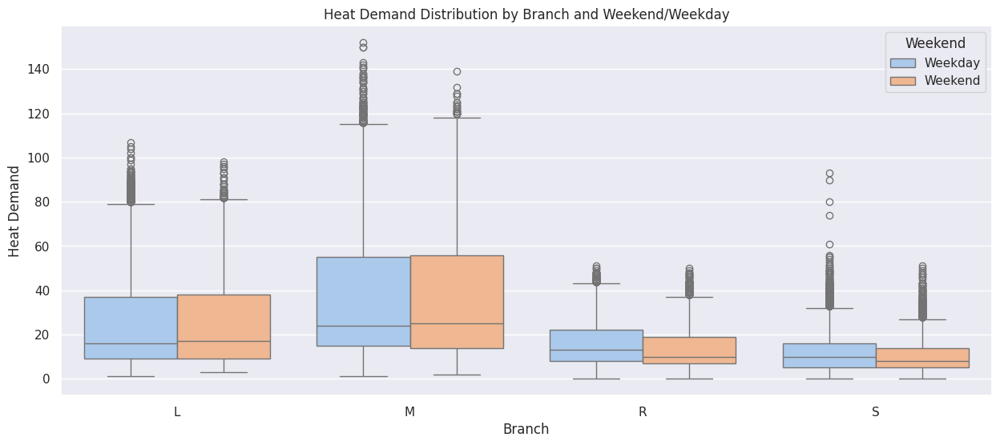

In [ ]:
# 주말/평일 시간대별 패턴
plt.figure(figsize=(15, 6))
sns.boxplot(data=cluster_3, x='hour', y='heat_demand',
            hue='is_weekend')
plt.title('Heat Demand Distribution by Hour and Weekend/Weekday')
plt.xlabel('Hour')
plt.ylabel('Heat Demand')
plt.legend(title='Weekend')
plt.show()

# Weekend/Weekday pattern by branch
plt.figure(figsize=(15, 6))
sns.boxplot(data=cluster_3, x='branch_id', y='heat_demand',
            hue='is_weekend')
plt.title('Heat Demand Distribution by Branch and Weekend/Weekday')
plt.xlabel('Branch')
plt.ylabel('Heat Demand')
plt.legend(title='Weekend')
plt.show()


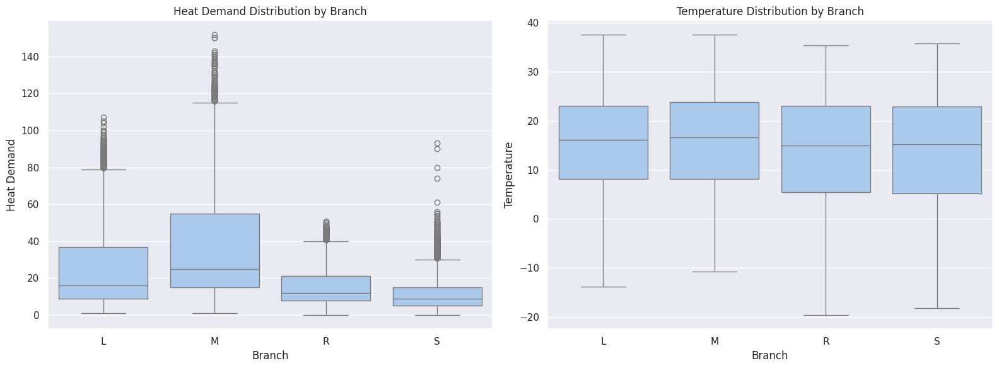

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 6))

# 열수요 분포
plt.subplot(1, 2, 1)
sns.boxplot(data=cluster_3, x='branch_id', y='heat_demand')
plt.title('Heat Demand Distribution by Branch')
plt.xlabel('Branch')
plt.ylabel('Heat Demand')

# 온도 분포
plt.subplot(1, 2, 2)
sns.boxplot(data=cluster_3, x='branch_id', y='ta')
plt.title('Temperature Distribution by Branch')
plt.xlabel('Branch')
plt.ylabel('Temperature')

plt.tight_layout()
plt.show()


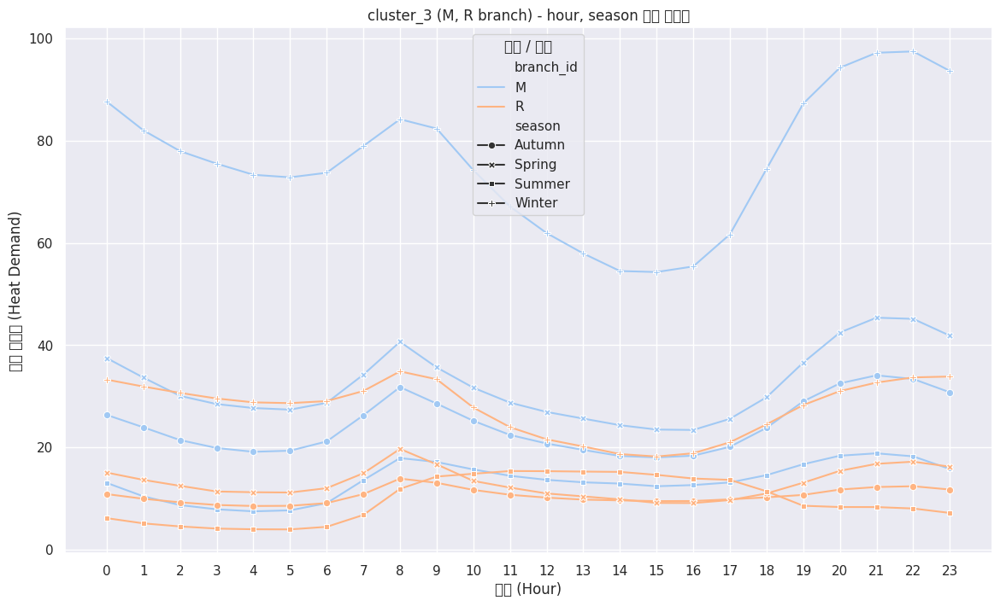

In [ ]:

# M, R 브랜치 데이터만 선택
m_r_df = cluster_3[cluster_3['branch_id'].isin(['M', 'R'])]

# 시간대별, 계절별 평균 열수요 계산
heat_demand_hour_season = m_r_df.groupby(['branch_id', 'season', 'hour'])['heat_demand'].mean().reset_index()

# 그래프 그리기
plt.figure(figsize=(14,8))
sns.lineplot(data=heat_demand_hour_season, x='hour', y='heat_demand', hue='branch_id', style='season', markers=True, dashes=False)

plt.title('cluster_3 (M, R branch) - hour, season 평균 열수요')
plt.xlabel('시간 (Hour)')
plt.ylabel('평균 열수요 (Heat Demand)')
plt.xticks(range(0,24))
plt.legend(title='지사 / 계절')
plt.grid(True)
plt.show()

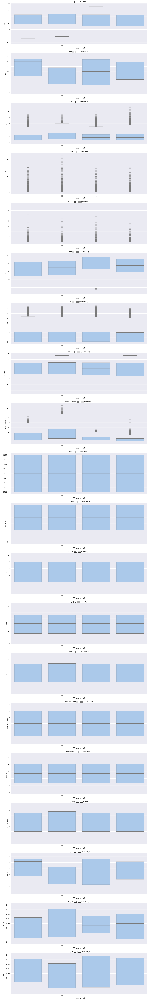

In [ ]:
#변수별이상치
# 수치형 변수만 선택
num_cols = cluster_3.select_dtypes(include=['number']).columns.tolist()

# 그래프 크기 조절
plt.figure(figsize=(15, 5 * len(num_cols)))

# 변수별 박스플롯 그리기
for i, col in enumerate(num_cols, 1):
    plt.subplot(len(num_cols), 1, i)
    sns.boxplot(x='branch_id', y=col, data=cluster_3)
    plt.title(f'{col} 분포 및 이상치 (cluster_3)')
    plt.xlabel('지사 (branch_id)')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

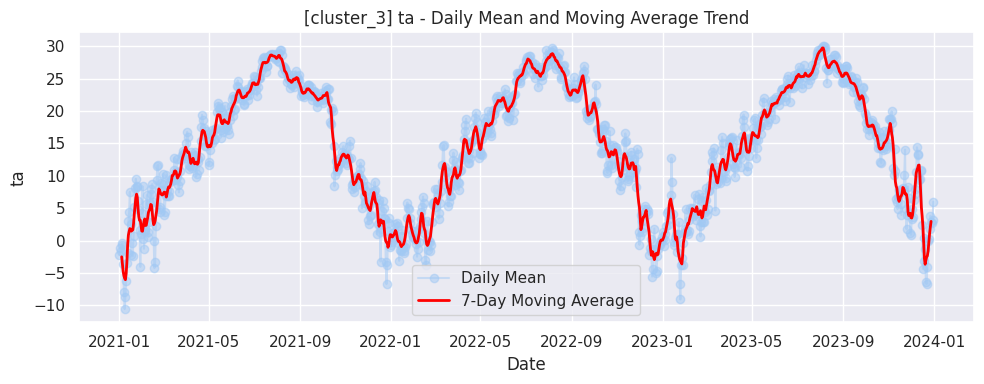

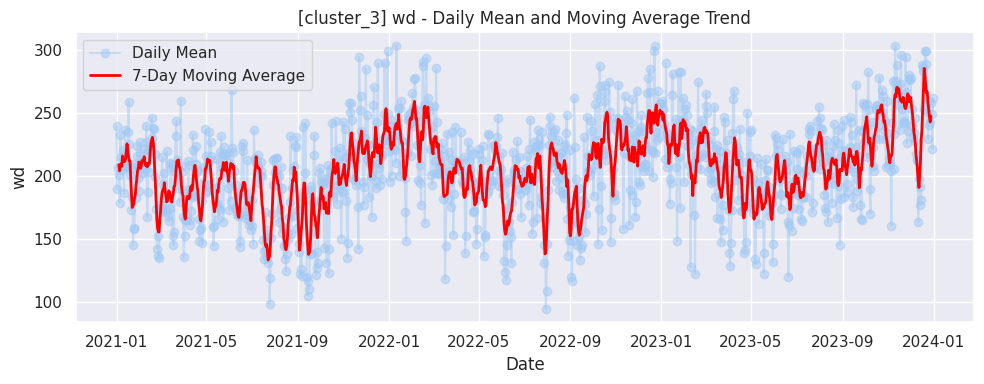

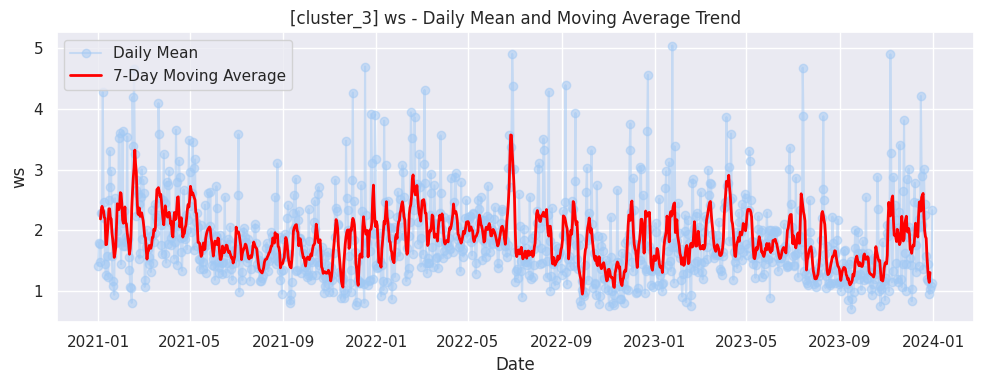

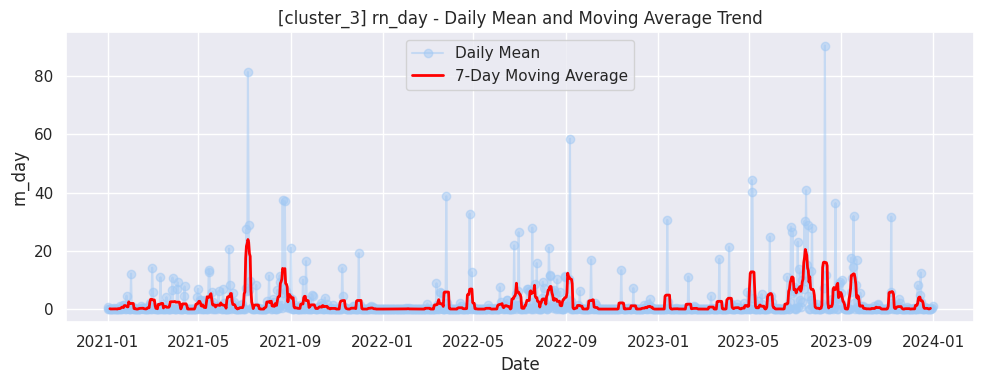

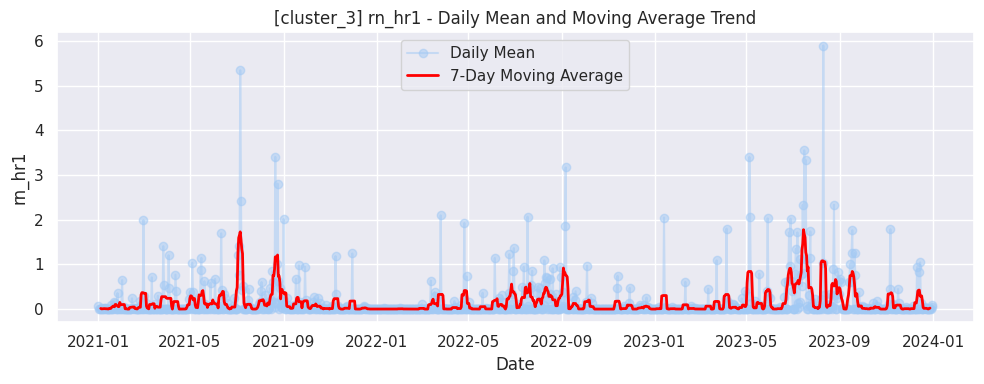

...

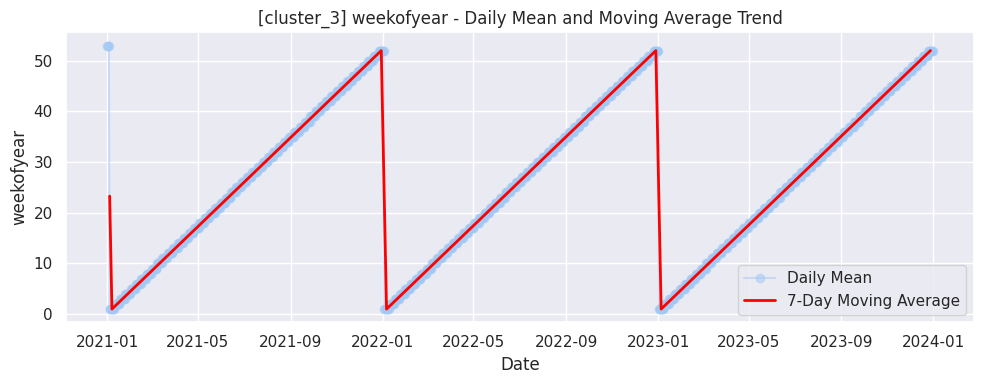

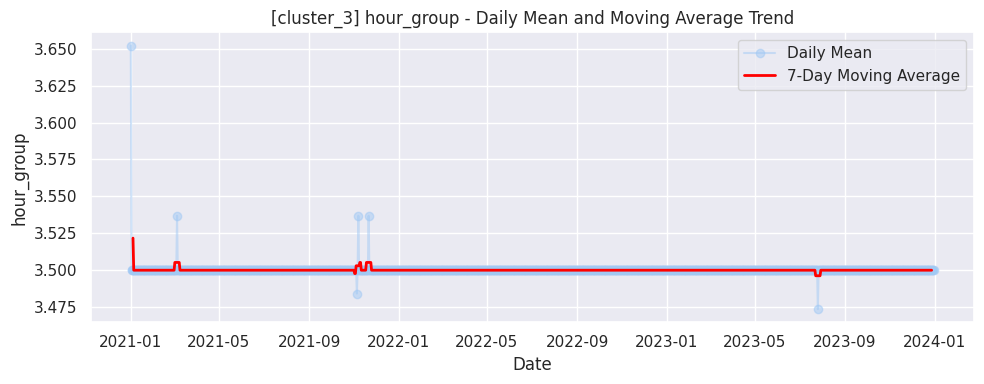

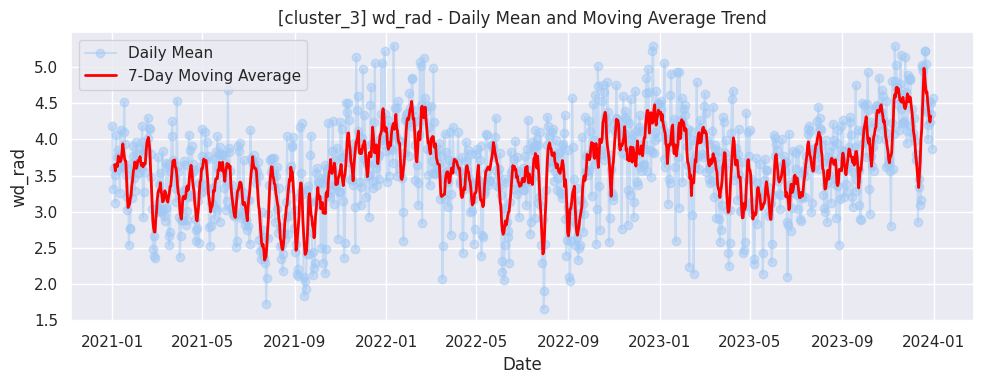

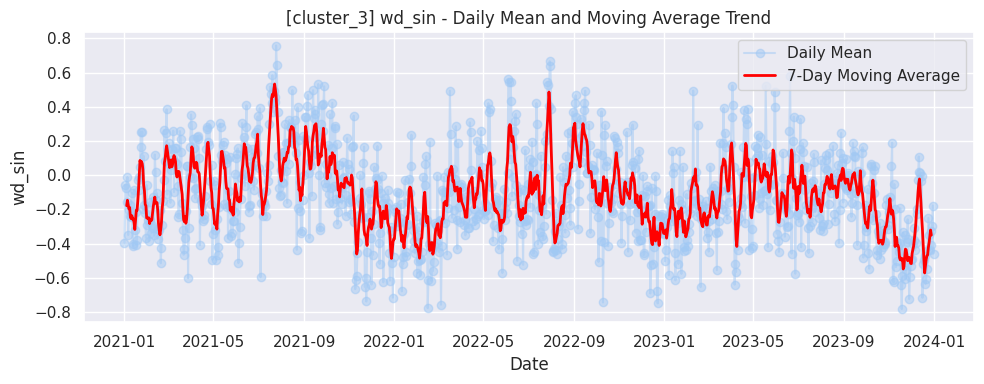

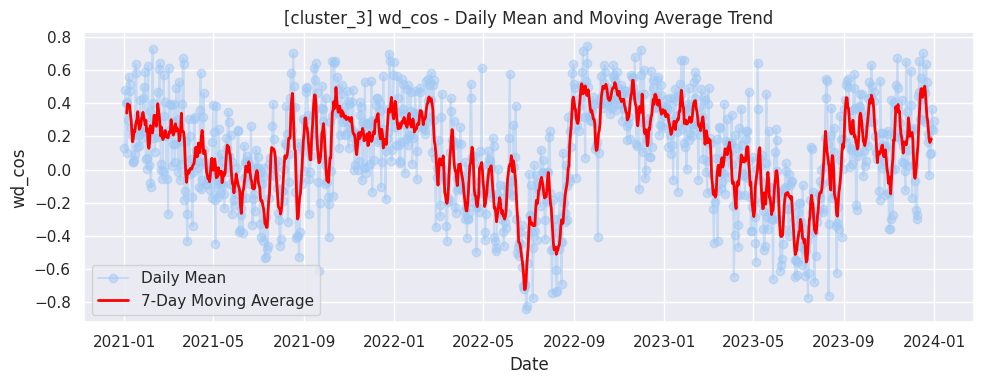

In [ ]:
#이동평균 변수 ?
import pandas as pd
import matplotlib.pyplot as plt

# datetime 처리
cluster_3['tm'] = pd.to_datetime(cluster_3['tm'])
cluster_3['date'] = cluster_3['tm'].dt.date

# 수치형 변수만 선택
numeric_cols = cluster_3.select_dtypes(include='number').columns

# 일자별 평균 계산
daily_mean = cluster_3.groupby('date')[numeric_cols].mean().reset_index()
daily_mean['date'] = pd.to_datetime(daily_mean['date'])

# 이동평균 window 크기 설정
window_size = 7  # 7일 이동평균 (필요시 변경 가능)

# 시각화
for col in numeric_cols:
    if col == 'cluster':  # Skip cluster column
        continue

    plt.figure(figsize=(10, 4))
    plt.plot(daily_mean['date'], daily_mean[col], label='Daily Mean', marker='o', alpha=0.5)
    plt.plot(daily_mean['date'], daily_mean[col].rolling(window=window_size, center=True).mean(),
             label=f'{window_size}-Day Moving Average', color='red', linewidth=2)

    plt.title(f"[cluster_3] {col} - Daily Mean and Moving Average Trend")
    plt.xlabel("Date")
    plt.ylabel(col)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()



<Figure size 1000x400 with 0 Axes>

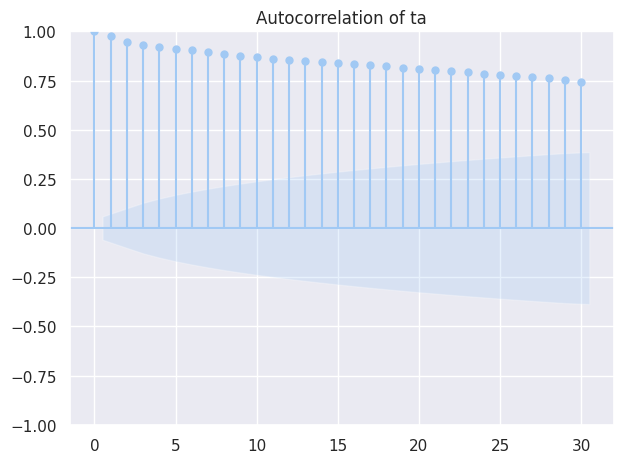

<Figure size 1000x400 with 0 Axes>

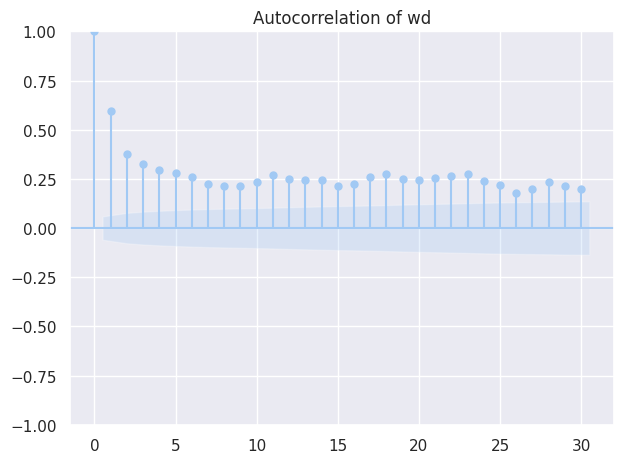

<Figure size 1000x400 with 0 Axes>

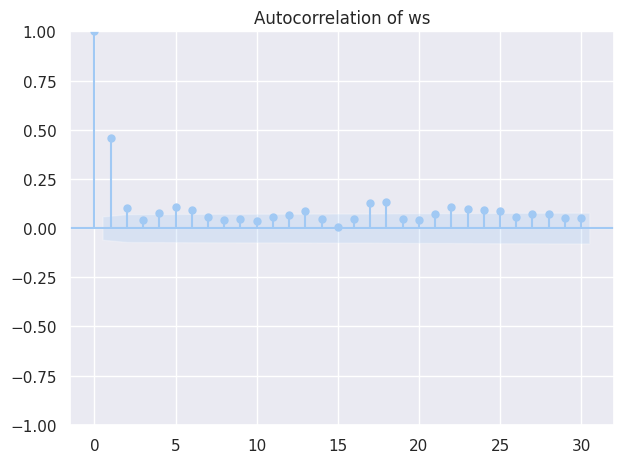

<Figure size 1000x400 with 0 Axes>

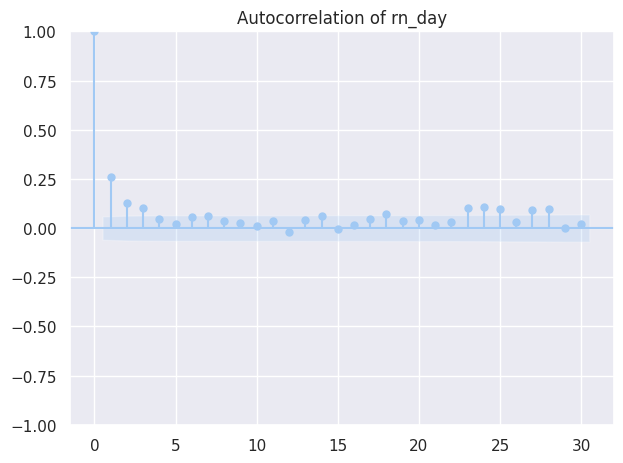

<Figure size 1000x400 with 0 Axes>

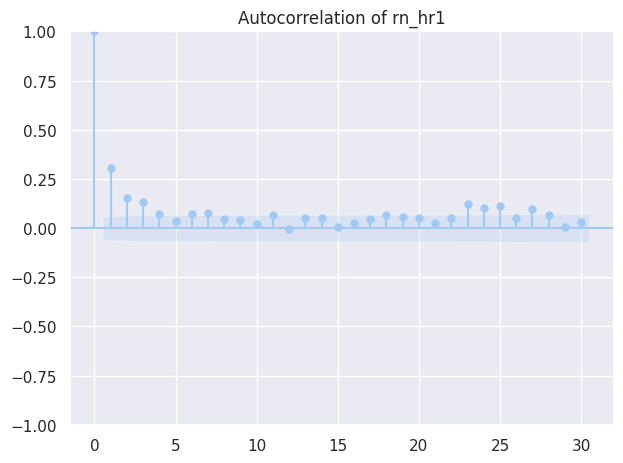

<Figure size 1000x400 with 0 Axes>

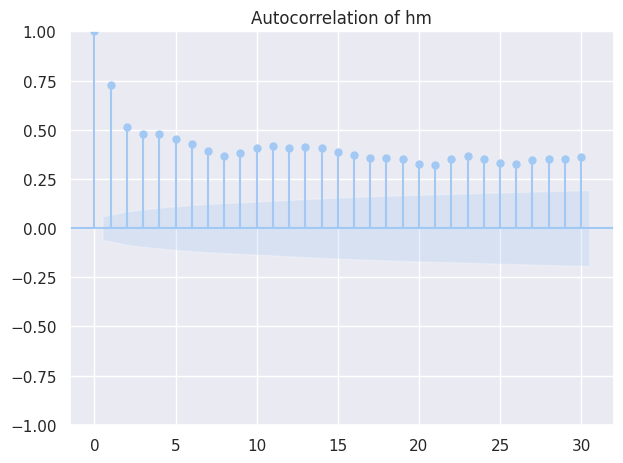

<Figure size 1000x400 with 0 Axes>

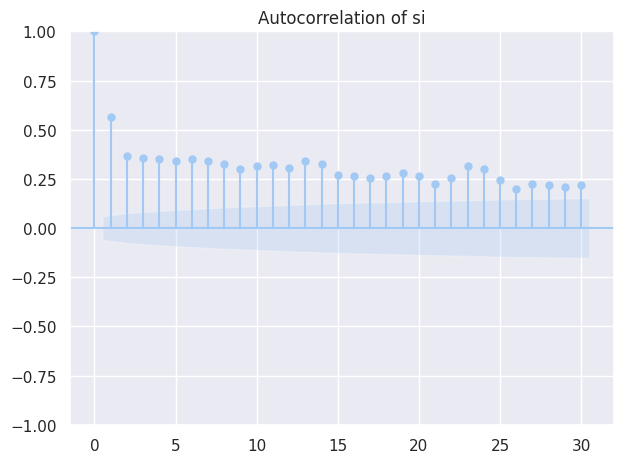

<Figure size 1000x400 with 0 Axes>

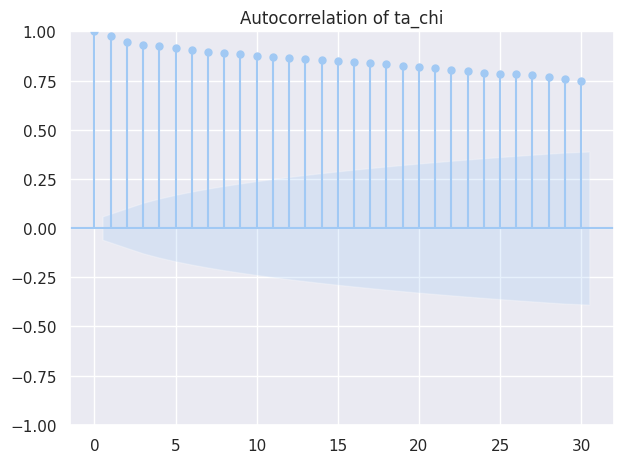

<Figure size 1000x400 with 0 Axes>

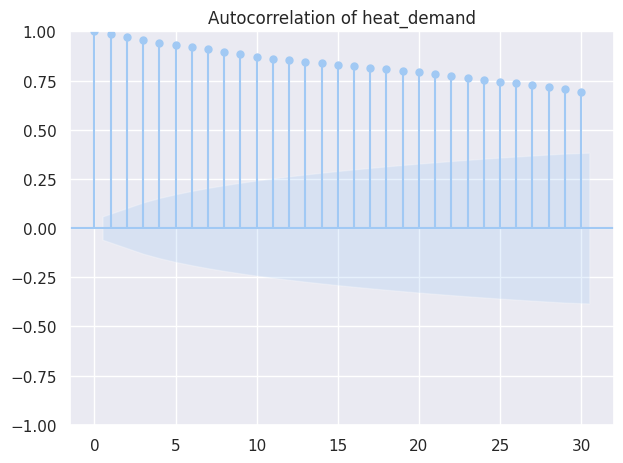

<Figure size 1000x400 with 0 Axes>

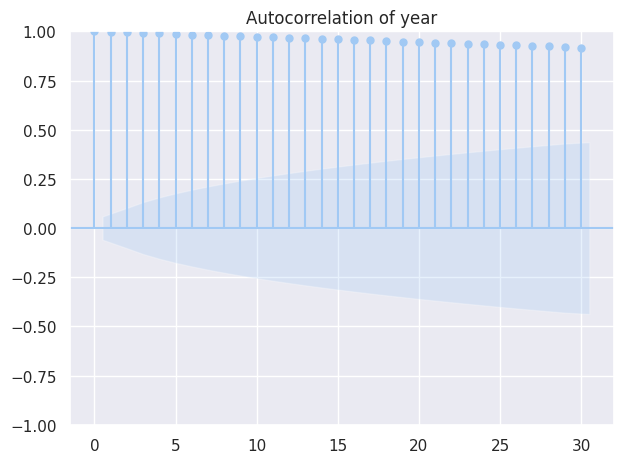

<Figure size 1000x400 with 0 Axes>

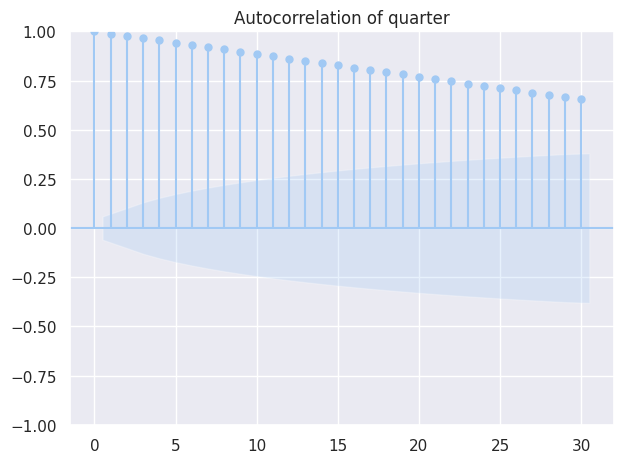

<Figure size 1000x400 with 0 Axes>

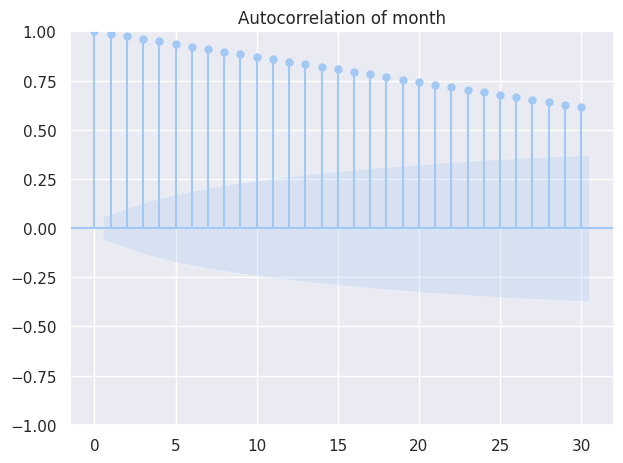

<Figure size 1000x400 with 0 Axes>

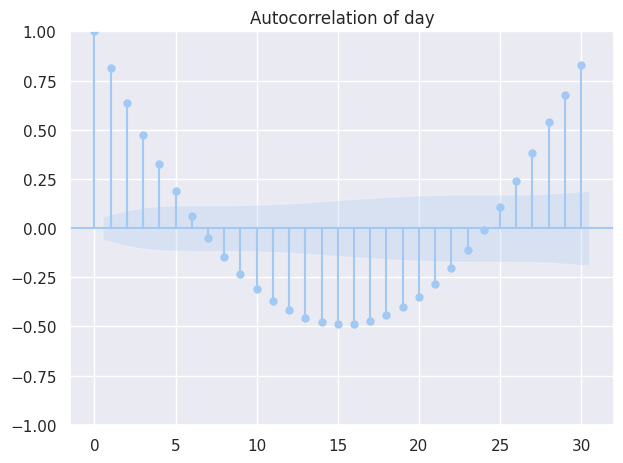

<Figure size 1000x400 with 0 Axes>

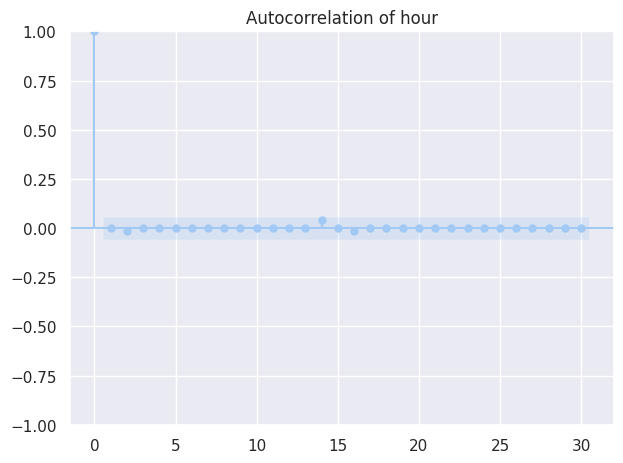

<Figure size 1000x400 with 0 Axes>

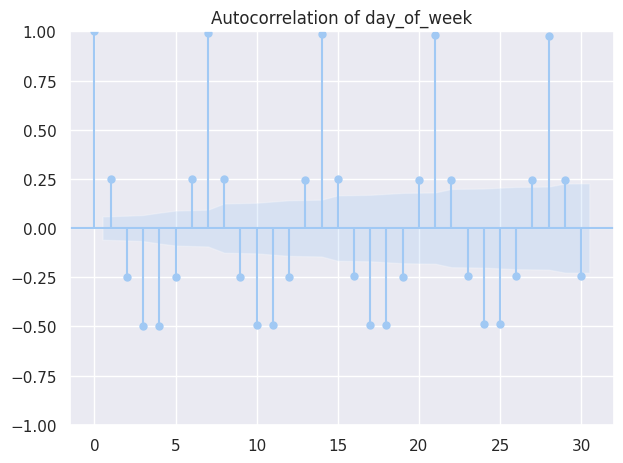

<Figure size 1000x400 with 0 Axes>

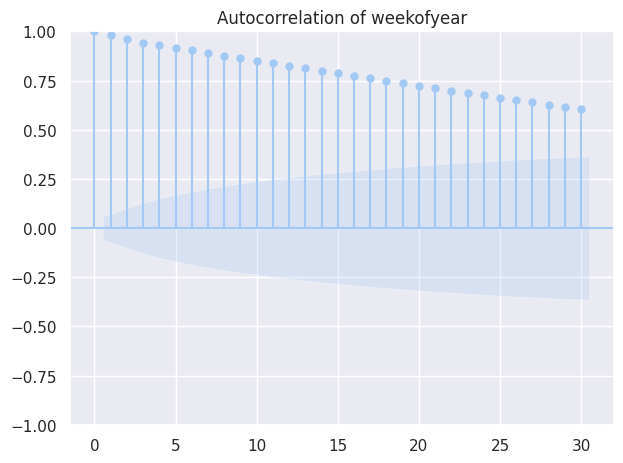

<Figure size 1000x400 with 0 Axes>

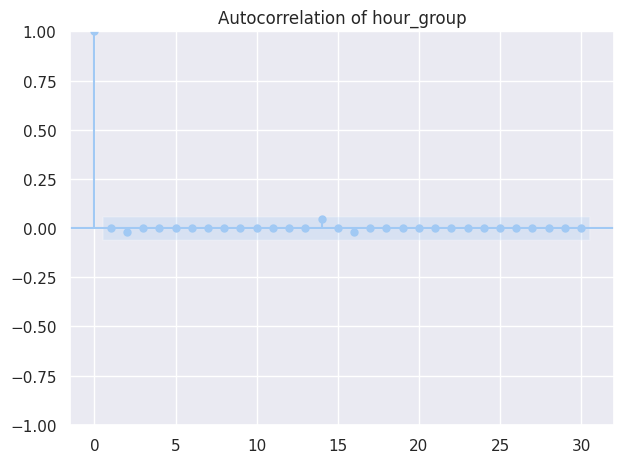

<Figure size 1000x400 with 0 Axes>

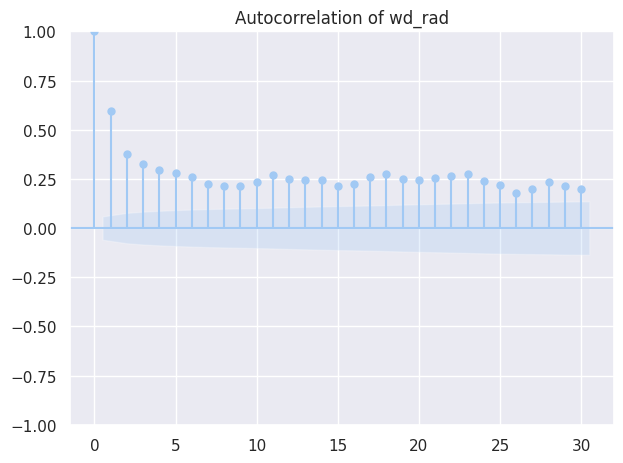

<Figure size 1000x400 with 0 Axes>

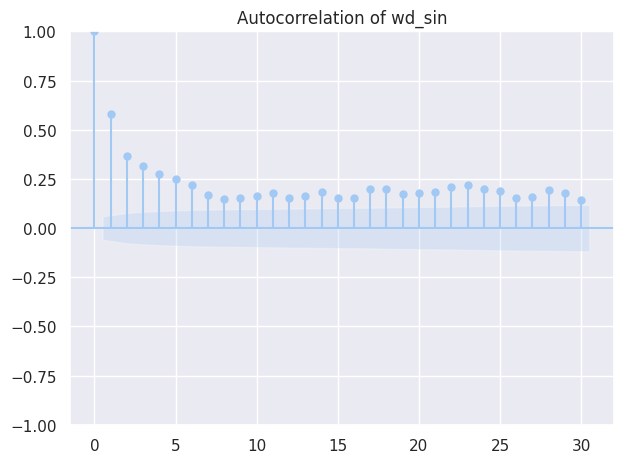

<Figure size 1000x400 with 0 Axes>

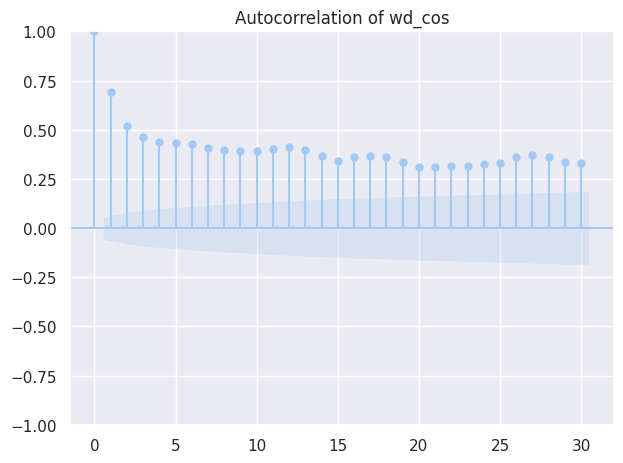

In [ ]:
#lag변수

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# 일자별 평균값 사용
daily_df = cluster_3.copy()
daily_df['tm'] = pd.to_datetime(daily_df['tm'])
daily_df['date'] = daily_df['tm'].dt.date
numeric_cols = cluster_3.select_dtypes(include='number').columns

daily_mean = daily_df.groupby('date')[numeric_cols].mean()

# 변수별 ACF 시각화
for col in numeric_cols:
    if col == 'cluster':
        continue

    plt.figure(figsize=(10, 4))
    plot_acf(daily_mean[col], lags=30, alpha=0.05)  # 최대 30일 lag까지
    plt.title(f"Autocorrelation of {col}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


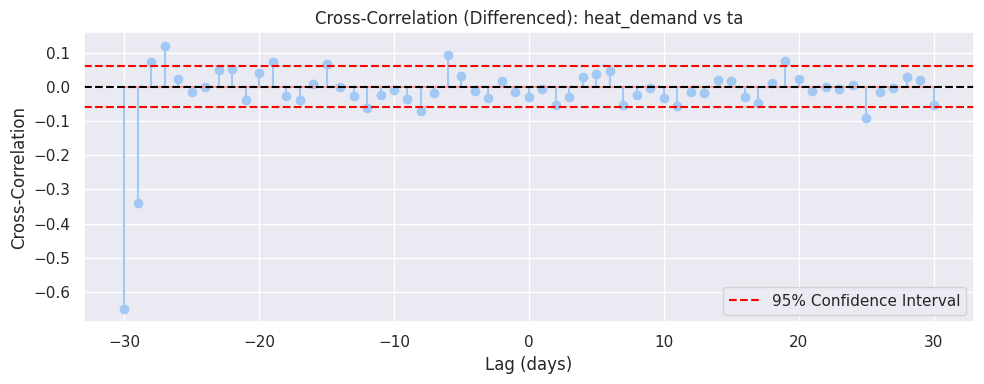

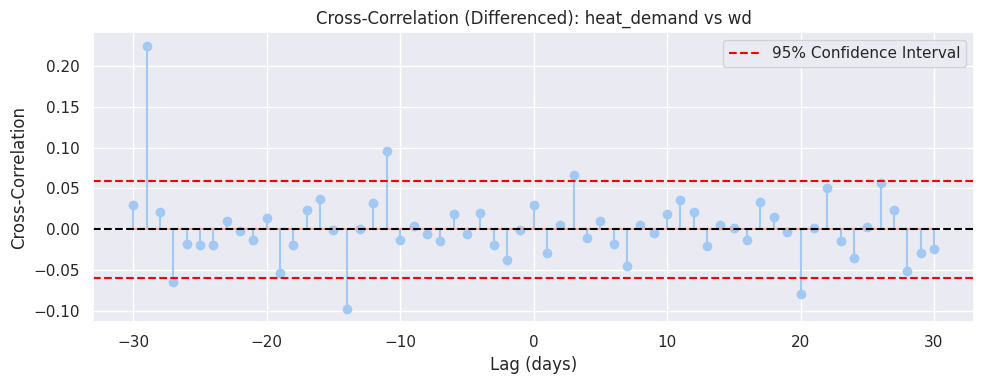

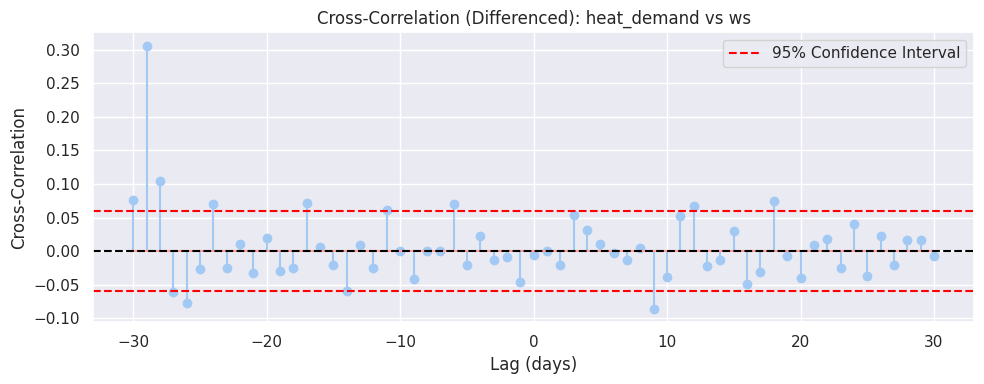

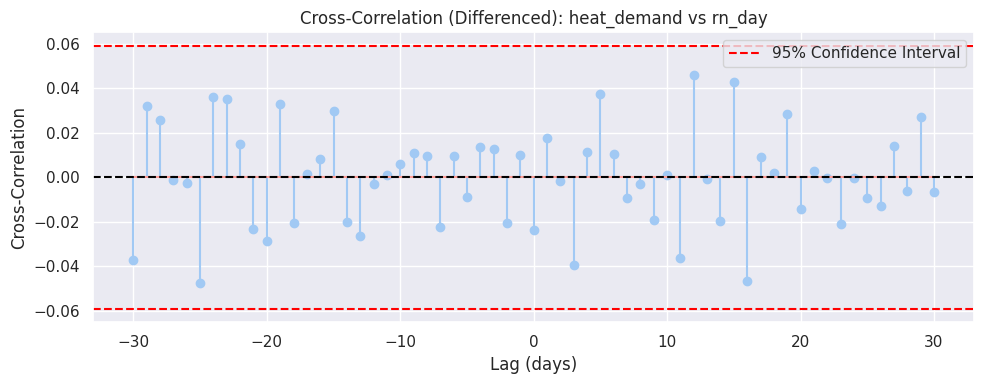

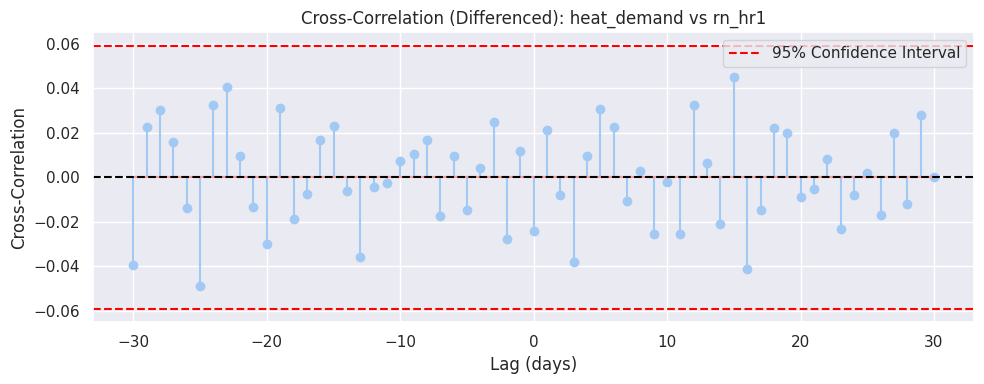

...

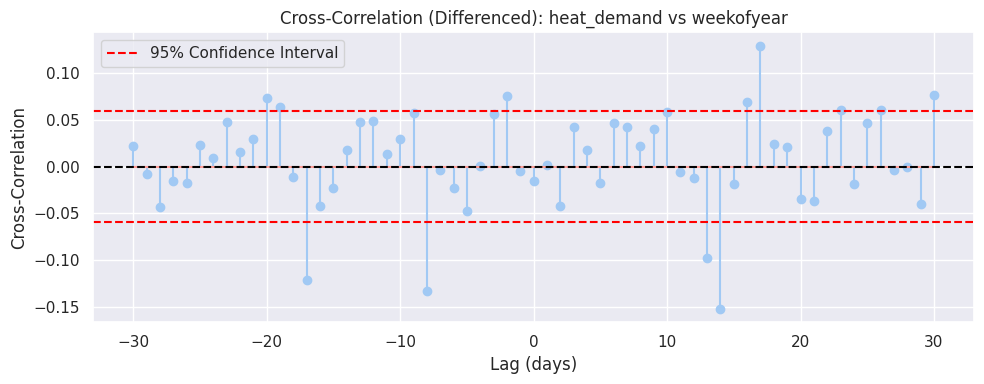

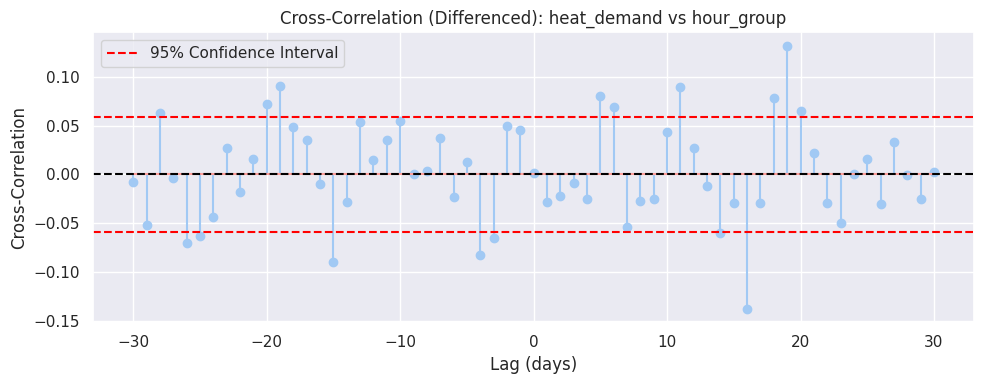

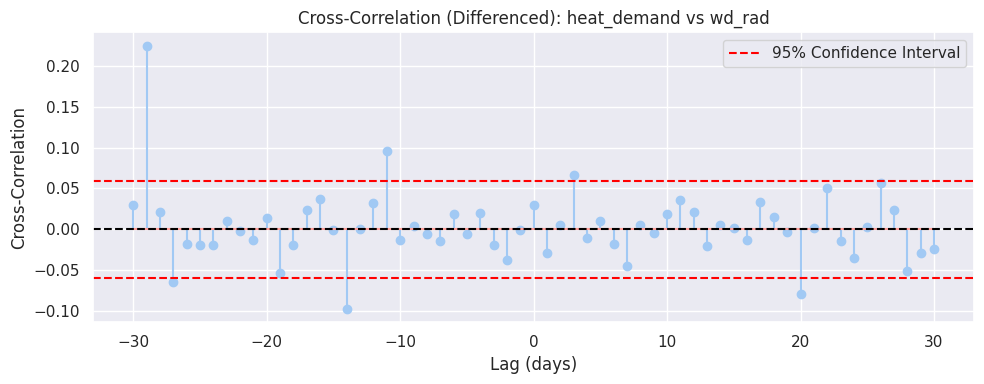

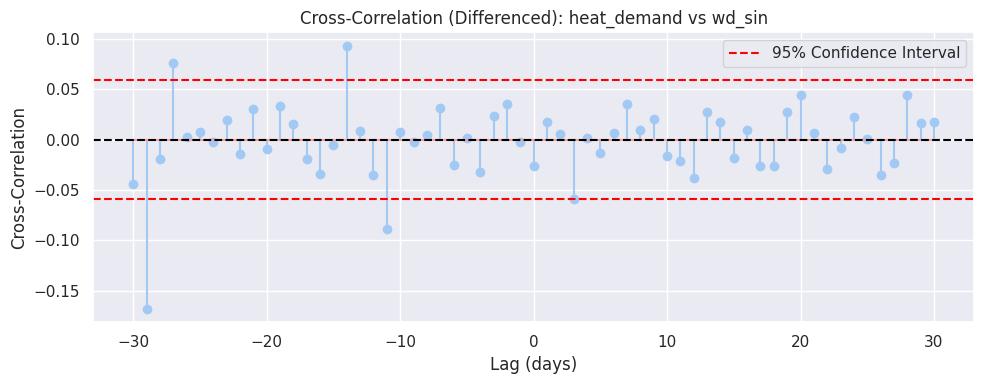

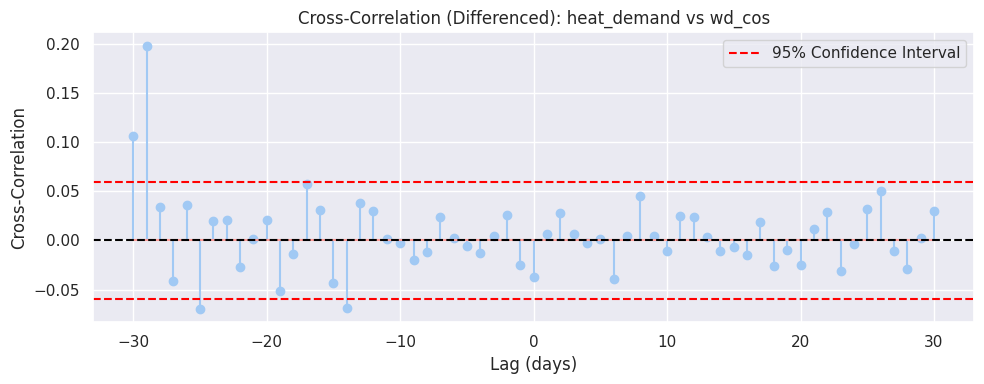

In [ ]:
from statsmodels.tsa.stattools import ccf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


# 날짜 처리 및 일별 평균
cluster_3['tm'] = pd.to_datetime(cluster_3['tm'])
cluster_3['date'] = cluster_3['tm'].dt.date

# 숫자형 변수만 선택
numeric_cols = cluster_3.select_dtypes(include=[np.number]).columns

# 숫자형 변수만 그룹별 평균
daily_df = cluster_3.groupby('date')[numeric_cols].mean()

target_var = 'heat_demand'

# 분석할 변수 리스트 (heat_demand 제외)
variables = [col for col in daily_df.columns if col != target_var]

# target_var 1차 차분
target_diff = daily_df[target_var].diff().dropna()

max_lag = 30

for var in variables:
    var_diff = daily_df[var].diff().dropna()

    # 길이 맞추기
    min_len = min(len(target_diff), len(var_diff))
    x = target_diff[:min_len]
    y = var_diff[:min_len]

    # CCF 계산
    ccf_vals = ccf(x, y)[:max_lag * 2 + 1]
    lags_range = np.arange(-max_lag, max_lag + 1)

    # 신뢰구간 계산 (95% 신뢰수준)
    N = len(x)
    conf_level = 1.96 / np.sqrt(N)

    plt.figure(figsize=(10, 4))
    plt.stem(lags_range, ccf_vals)  # use_line_collection 제거
    plt.title(f"Cross-Correlation (Differenced): {target_var} vs {var}")
    plt.xlabel("Lag (days)")
    plt.ylabel("Cross-Correlation")
    plt.grid(True)
    plt.axhline(0, color='black', linestyle='--')
    plt.axhline(conf_level, color='red', linestyle='--', label='95% Confidence Interval')
    plt.axhline(-conf_level, color='red', linestyle='--')
    plt.legend()
    plt.tight_layout()
    plt.show()